# That's a spicy cloud; A comparative study to approaches for Tropical Storm intensity estimation from Raw and Infrared Satellite images

In [ ]:
from radiant_mlhub import Dataset
datasets = Dataset.list()
# print the first 5 datasets for example
for dataset in datasets[0:5]:
    print(dataset)

In [ ]:
datasets = Dataset.list()

In [ ]:
dataset = Dataset.fetch("nasa_tropical_storm_competition")

In [ ]:
print(dataset.stac_catalog_size)
print(dataset.estimated_dataset_size)

### THE FOLLOWING COMMAND RUNS FOR NEARLY 6-7 HOURS for the data set download

In [ ]:
#dataset.download()

In [ ]:
# Instead the dataset can be downloaded from kaggle: https://kaggle.com/datasets/3a0609d3ee5dfb541d06daa814f3f004f871a9b2cfb4785a76ec56dc7b548c5c

## Dataset Management

In [ ]:
import os
import shutil
import json
import csv
from PIL import Image
import pandas as pd

currentfolder = os.path.abspath(os.getcwd())

imagepath = f"{currentfolder}\\nasa_tropical_storm_competition\\nasa_tropical_storm_competition_train_source"
imagelabels = f"{currentfolder}\\nasa_tropical_storm_competition\\nasa_tropical_storm_competition_train_labels"
imagepath_test = f"{currentfolder}\\nasa_tropical_storm_competition\\nasa_tropical_storm_competition_test_source"
imagelabels_test = f"{currentfolder}\\nasa_tropical_storm_competition\\nasa_tropical_storm_competition_test_labels"
Training_Csv = pd.DataFrame(columns=['CycloneImageId','Wind_Speed'])
Testing_Csv =  pd.DataFrame(columns=['CycloneImageId','Wind_Speed'])

In [ ]:
imagelabels_test

## Training Images Organization from assets

In [115]:
#Refrence:https://stackoverflow.com/questions/123198/how-to-copy-files

In [ ]:
for dirpath, dirnames, filenames in os.walk(imagepath):
    if (dirpath.split('\\')[-1]).startswith("nasa_tropical_storm_competition_train_source_"):
        source_folder = dirpath+"\\"+"image.jpg"
        destination = currentfolder+"\\Raw_Images\\"+"Cyclone_"+dirpath.split('\\')[-1].split("_")[-2]
        os.makedirs(destination, exist_ok=True)
        destination_fold = os.path.join(destination, "Cyclone_"+dirpath.split('\\')[-1].split("_")[-2]+"_"+dirpath.split('\\')[-1].split("_")[-1]+".jpg")
        shutil.copy(source_folder, destination_fold)

## Training label consolidation

In [ ]:

for dirpath, dirnames, filenames in os.walk(imagelabels):
    if (dirpath.split('\\')[-1]).startswith("nasa_tropical_storm_competition_train_labels_"):
        source_folder = dirpath+"\\"+"vector_labels.json"
        data = json.load(open(source_folder))
        new_row = ["Cyclone_"+dirpath.split('\\')[-1].split("_")[-2]+"_"+dirpath.split('\\')[-1].split("_")[-1]+".jpg",data['wind_speed']]
        Training_Csv.loc[len(Training_Csv)] = new_row
Training_Csv.to_csv(f"{currentfolder}"+"\\Raw_Images\\Cyclone_trainingdata_labels.csv")

## Test Images Organization from assets

In [ ]:
for dirpath, dirnames, filenames in os.walk(imagepath_test):
    if (dirpath.split('\\')[-1]).startswith("nasa_tropical_storm_competition_test_source_"):
        source_folder = dirpath+"\\"+"image.jpg"
        destination = currentfolder+"\\Raw_Images\\Test\\"+"Cyclone_"+dirpath.split('\\')[-1].split("_")[-2]
        os.makedirs(destination, exist_ok=True)
        destination_fold = os.path.join(destination, "Cyclone_"+dirpath.split('\\')[-1].split("_")[-2]+"_"+dirpath.split('\\')[-1].split("_")[-1]+".jpg")
        shutil.copy(source_folder, destination_fold)

## Test label consolidation

In [ ]:
for dirpath, dirnames, filenames in os.walk(imagelabels_test):
    if (dirpath.split('\\')[-1]).startswith("nasa_tropical_storm_competition_test_labels_"):
        source_folder = dirpath+"\\"+"vector_labels.json"
        data = json.load(open(source_folder))
        new_row = ["Cyclone_"+dirpath.split('\\')[-1].split("_")[-2]+"_"+dirpath.split('\\')[-1].split("_")[-1]+".jpg",data['wind_speed']]
        Testing_Csv.loc[len(Testing_Csv)] = new_row
Testing_Csv.to_csv(f"{currentfolder}"+"\\Raw_Images\\Test\\Cyclone_testdata_labels.csv")

# Main Code

In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import os.path
import tensorflow as tf
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from keras.utils.np_utils import to_categorical
from PIL import Image
import datetime 
import numpy as np
import os
import keras as keras
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.layers import Conv2D, Dense, GlobalAveragePooling2D,Dense, MaxPooling2D, \
                                    Flatten, BatchNormalization, Dropout, Input, concatenate,MaxPool2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.callbacks import ModelCheckpoint

C:\Users\sbdev\AppData\Roaming\Python\Python39\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
TData = pd.read_csv(r"C:\Users\sbdev\Documents\ComputerVision\Project\70KData\new\Raw_Images\Cyclone_trainingdata_labels.csv")

In [3]:
TData

,CycloneImageId,Wind_Speed,ImagePath
0,Cyclone_abs_000.jpg,43,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...
1,Cyclone_abs_001.jpg,44,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...
2,Cyclone_abs_002.jpg,45,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...
3,Cyclone_abs_003.jpg,52,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...
4,Cyclone_abs_004.jpg,53,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...
...,...,...,...
70252,Cyclone_zzp_221.jpg,42,..\new\Raw_Images\Train\Cyclone_zzp\Cyclone_zz...
70253,Cyclone_zzp_222.jpg,40,..\new\Raw_Images\Train\Cyclone_zzp\Cyclone_zz...
70254,Cyclone_zzp_223.jpg,37,..\new\Raw_Images\Train\Cyclone_zzp\Cyclone_zz...
70255,Cyclone_zzp_224.jpg,35,..\new\Raw_Images\Train\Cyclone_zzp\Cyclone_zz...


In [4]:
TeData = pd.read_csv(r"C:\Users\sbdev\Documents\ComputerVision\Project\70KData\new\Raw_Images\Cyclone_testdata_labels.csv")

In [5]:
TeData

,CycloneImageId,Wind_Speed,ImagePath
0,Cyclone_acd_123.jpg,34,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...
1,Cyclone_acd_124.jpg,34,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...
2,Cyclone_acd_125.jpg,33,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...
3,Cyclone_acd_126.jpg,33,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...
4,Cyclone_acd_127.jpg,32,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...
...,...,...,...
44372,Cyclone_zza_174.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...
44373,Cyclone_zza_175.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...
44374,Cyclone_zza_176.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...
44375,Cyclone_zza_177.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...


In [6]:
#Reference: https://www.mdpi.com/2073-4433/13/7/1113
#Refrence: https://www.mdpi.com/2073-4433/13/5/783
def add_wind_speed_class(df):
    bins = [0, 38.9, 61.6, 87.8, 117.4, 149.0, 183.2, float('inf')]
    labels = ['0', '1', '2', '3', '4', '5', '6']
    df['wind_speed_class'] = pd.cut(df['Wind_Speed'], bins=bins, labels=labels)
    return df

In [7]:
Train_data = add_wind_speed_class(TData)
Train_data

,CycloneImageId,Wind_Speed,ImagePath,wind_speed_class
0,Cyclone_abs_000.jpg,43,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...,1
1,Cyclone_abs_001.jpg,44,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...,1
2,Cyclone_abs_002.jpg,45,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...,1
3,Cyclone_abs_003.jpg,52,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...,1
4,Cyclone_abs_004.jpg,53,..\new\Raw_Images\Train\Cyclone_abs\Cyclone_ab...,1
...,...,...,...,...
70252,Cyclone_zzp_221.jpg,42,..\new\Raw_Images\Train\Cyclone_zzp\Cyclone_zz...,1
70253,Cyclone_zzp_222.jpg,40,..\new\Raw_Images\Train\Cyclone_zzp\Cyclone_zz...,1
70254,Cyclone_zzp_223.jpg,37,..\new\Raw_Images\Train\Cyclone_zzp\Cyclone_zz...,0
70255,Cyclone_zzp_224.jpg,35,..\new\Raw_Images\Train\Cyclone_zzp\Cyclone_zz...,0


In [8]:
Test_data = add_wind_speed_class(TeData)
Test_data

,CycloneImageId,Wind_Speed,ImagePath,wind_speed_class
0,Cyclone_acd_123.jpg,34,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
1,Cyclone_acd_124.jpg,34,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
2,Cyclone_acd_125.jpg,33,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
3,Cyclone_acd_126.jpg,33,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
4,Cyclone_acd_127.jpg,32,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
...,...,...,...,...
44372,Cyclone_zza_174.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...,0
44373,Cyclone_zza_175.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...,0
44374,Cyclone_zza_176.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...,0
44375,Cyclone_zza_177.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...,0


In [113]:
Test_data

,CycloneImageId,Wind_Speed,ImagePath,wind_speed_class
0,Cyclone_acd_123.jpg,34,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
1,Cyclone_acd_124.jpg,34,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
2,Cyclone_acd_125.jpg,33,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
3,Cyclone_acd_126.jpg,33,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
4,Cyclone_acd_127.jpg,32,..\new\Raw_Images\Test\Cyclone_acd\Cyclone_acd...,0
...,...,...,...,...
44372,Cyclone_zza_174.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...,0
44373,Cyclone_zza_175.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...,0
44374,Cyclone_zza_176.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...,0
44375,Cyclone_zza_177.jpg,20,..\new\Raw_Images\Test\Cyclone_zza\Cyclone_zza...,0


## Keras Image Augmentation for the Classification Dataset

- On a side note, ww have also tried using 128x128, 200x200 and 200x200 as the image dimenstions but the better results we obtained from the follwoing dimentions

- Using the full image size was not performed due to intensive memory requirements and we are performing the training in a personal laptop with graphics card.

In [19]:
#Reference: https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator
Target_size = (256,256)
Target_model_size = (256,256,3)
Target_model_size2 = (128,128,3)
def DatagenfromDF(TrainingData,TestingData,ResizeShape=(128,128),checktest=False):    
    train_generator = ImageDataGenerator(
        rescale=1./255,
        horizontal_flip=True,
        vertical_flip=True,
        validation_split=0.2
    )
    test_generator = ImageDataGenerator(
        TestingData,
        rescale=1./255,
        
    )

    train_classification_images = train_generator.flow_from_dataframe(
        dataframe=TrainingData,
        x_col='ImagePath',
        y_col='wind_speed_class',
        target_size=ResizeShape,
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=42,
        subset='training'
    )

    val_classification_images = train_generator.flow_from_dataframe(
        dataframe=TrainingData,
        x_col='ImagePath',
        y_col='wind_speed_class',
        target_size=ResizeShape,
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=42,
        subset='validation'
    )
    if checktest:
        test_generator = ImageDataGenerator(
            rescale=1./255,

        )
        test_class_images = test_generator.flow_from_dataframe(
            dataframe=TestingData,
            x_col='ImagePath',
            y_col='wind_speed_class',
            target_size=ResizeShape,
            color_mode='rgb',
            class_mode='categorical',
            batch_size=1,
            shuffle=False,
            seed=42,
        )
    else:
        test_class_images = None
    return train_classification_images, val_classification_images, test_class_images

In [20]:
class_train,class_val,class_test = DatagenfromDF(Train_data,Test_data,Target_size,checktest=True)

Found 56206 validated image filenames belonging to 7 classes.
Found 14051 validated image filenames belonging to 7 classes.
Found 44377 validated image filenames belonging to 6 classes.


### The dataset has 70257 images split as 56206  training images and 14051 Validation images and 44377 test images

# Our baseline model for Classification

In [15]:
#Refernce: https://builtin.com/machine-learning/vgg16
def ClassificationBaseModel(ResizeShape=(256,256,3)):
# Sequential model is by far the most implemented model utilised for CNN.
    model=Sequential()
    model.add(Conv2D(filters=64, kernel_size = (3,3), activation="relu", input_shape=ResizeShape))
    model.add(Conv2D(filters=64, kernel_size = (3,3), activation="relu"))
    model.add(MaxPooling2D(pool_size=(2,2)))

    ### some of the parameters are greyed out based on the results obtained.
    # model.add(Dropout(0.25))

    # using normalisation for the layers of CNN :
    model.add(BatchNormalization())

    model.add(Conv2D(filters=128, kernel_size = (3,3), activation="relu"))
    model.add(Conv2D(filters=128, kernel_size = (3,3), activation="relu"))

    model.add(MaxPooling2D(pool_size=(2,2)))### some of the parameters are greyed out based on the results obtained.
    ### some of the parameters are greyed out based on the results obtained.
    # model.add(Dropout(0.4))

    model.add(BatchNormalization())    

    model.add(Conv2D(filters=256, kernel_size = (3,3), activation="relu"))
    model.add(MaxPooling2D(pool_size=(2,2)))

    # model.add(Dropout(0.3))
    model.add(BatchNormalization())

    model.add(Flatten())
    model.add(Dense(512,activation="relu"))
    # model.add(Dropout(0.3))

    # The final softmax function will transform the raw outputs of the neural network into a vector of probabilities, further used for prediction :
    model.add(Dense(7,activation="softmax"))
    model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["categorical_accuracy"])
    #model.summary()
    return model

In [16]:
ClassBaseModel = ClassificationBaseModel()

In [17]:
ClassBaseModel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 252, 252, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 126, 126, 64)     0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 126, 126, 64)     256       
 ormalization)                                                   
                                                                 
 conv2d_2 (Conv2D)           (None, 124, 124, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 122, 122, 128)     1

## Early stopping and dynamic learning rate callbacks for classification

In [25]:
#Reference: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping
#Reference: https://stackoverflow.com/questions/51889378/how-to-use-keras-reducelronplateau
early_stop = keras.callbacks.EarlyStopping(
        monitor="val_categorical_accuracy",
        patience=5,
        verbose=1,
        mode="max",
        restore_best_weights=True 
     )

## we use ReduceLROnPlateau as an early stopping way :

plateau_achieved = keras.callbacks.ReduceLROnPlateau(
        monitor="val_categorical_accuracy",
        factor=0.2,
        patience=2,
        verbose=1,
        mode="max",
        min_lr=0.00001,
     )

In [26]:
def PlotMetrics(HistoryObj,metrics):
    plt.figure(figsize=(20,10))
    plt.subplot(121)
    plt.plot(HistoryObj.history[f'{metrics[0]}'], label=f'Training {metrics[0]}')
    plt.plot(HistoryObj.history[f'val_{metrics[0]}'], label=f'Validation {metrics[0]}')
    plt.title(f'Training and validation {metrics[0]}')
    plt.xlabel('Epochs')
    plt.legend()
    plt.ylabel(f'{metrics[0]}')
    plt.subplot(122)
    plt.plot(HistoryObj.history[f'{metrics[1]}'], label=f'Training {metrics[1]}')
    plt.plot(HistoryObj.history[f'val_{metrics[1]}'], label=f'Validation {metrics[1]}')
    plt.title(f'Training and validation {metrics[1]}')
    plt.xlabel('Epochs')
    plt.ylabel(f'{metrics[1]}')
    plt.legend()
    plt.show()

## Base Model Training

In [20]:
BaseClassificationModelHistory = ClassBaseModel.fit(
    class_train,
    validation_data=class_val,
    epochs=50,
    callbacks=[early_stop, plateau_achieved]
)

Epoch 1/50
1757/1757 [==============================] - 293s 162ms/step - loss: 3.1124 - categorical_accuracy: 0.4854 - val_loss: 1.3024 - val_categorical_accuracy: 0.5216 - lr: 0.0010
Epoch 2/50
1757/1757 [==============================] - 288s 164ms/step - loss: 0.9293 - categorical_accuracy: 0.5851 - val_loss: 2.4554 - val_categorical_accuracy: 0.5089 - lr: 0.0010
Epoch 3/50
1757/1757 [==============================] - 287s 163ms/step - loss: 0.8375 - categorical_accuracy: 0.6221 - val_loss: 1.2749 - val_categorical_accuracy: 0.5358 - lr: 0.0010
Epoch 4/50
1757/1757 [==============================] - 286s 163ms/step - loss: 0.7834 - categorical_accuracy: 0.6412 - val_loss: 1.0381 - val_categorical_accuracy: 0.5864 - lr: 0.0010
Epoch 5/50
1757/1757 [==============================] - 289s 165ms/step - loss: 0.7379 - categorical_accuracy: 0.6630 - val_loss: 0.8764 - val_categorical_accuracy: 0.6297 - lr: 0.0010
Epoch 6/50
1757/1757 [==============================] - 285s 162ms/step - l

In [21]:
BaseClassificationModelHistory_df = pd.DataFrame(BaseClassificationModelHistory.history)
BCMH = 'BaseClassModelHistory.csv'
with open(BCMH, mode='w') as f:
    BaseClassificationModelHistory_df.to_csv(f)

In [22]:
ClassBaseModel.save('./ClassificationModels/ClassificationBase_256.h5')

In [104]:
#ClassBaseModel = keras.models.load_model('./ClassificationModels/ClassificationBase_256.h5')

## Training loss and accuracy

In [23]:
ClassBaseModel.evaluate(class_train)

1757/1757 [==============================] - 135s 77ms/step - loss: 0.4383 - categorical_accuracy: 0.8169


[0.43831542134284973, 0.8169234395027161]

In [105]:
Pred_class_ClassBase = ClassBaseModel.predict(class_test)
True_class_ClassBase = class_test.labels

# Prediction samples 

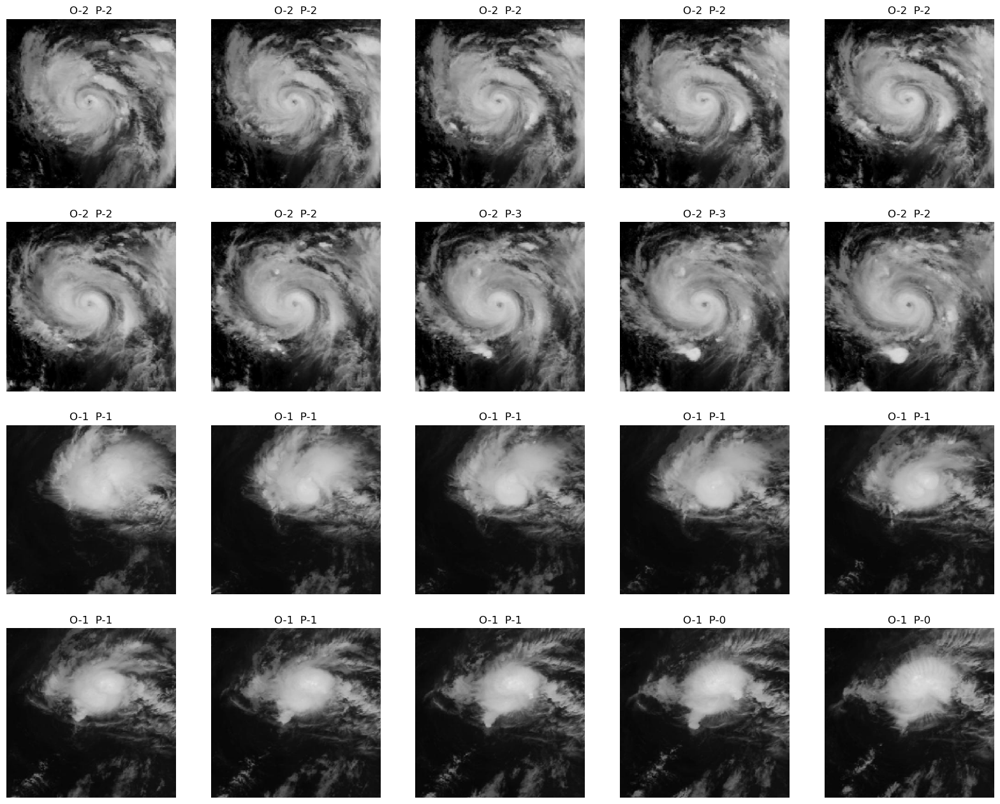

In [123]:
plt.figure(figsize=(20, 20))
addbase=300
for i in range(20):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(5,5, i + 1)
    plt.title("O-"+str(True_class_ClassBase[i+addbase])+"  P-"+str(Pred_class_ClassBase[i+addbase].argmax()))
    plt.imshow(cur_img)
    plt.axis("off")

# Edge Case visualization

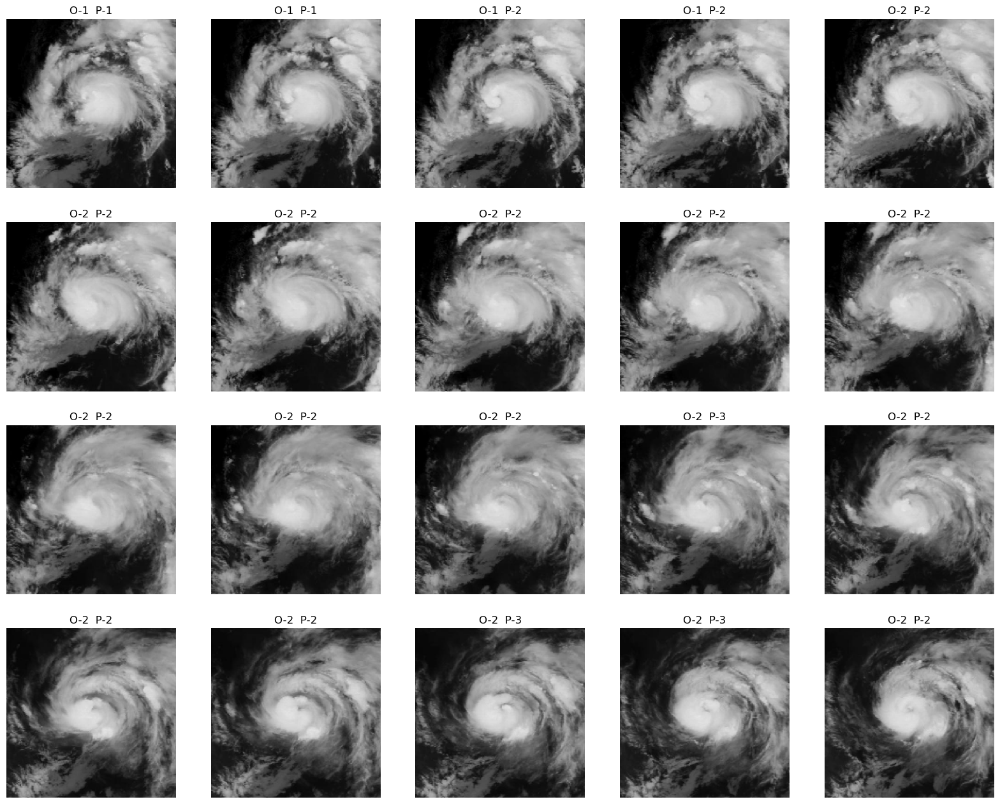

In [155]:
plt.figure(figsize=(20, 20))
addbase=260
for i in range(20):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(5,5, i + 1)
    plt.title("O-"+str(True_class_ClassBase[i+addbase])+"  P-"+str(Pred_class_ClassBase[i+addbase].argmax()))
    plt.imshow(cur_img)
    plt.axis("off")

## Prediction metrics

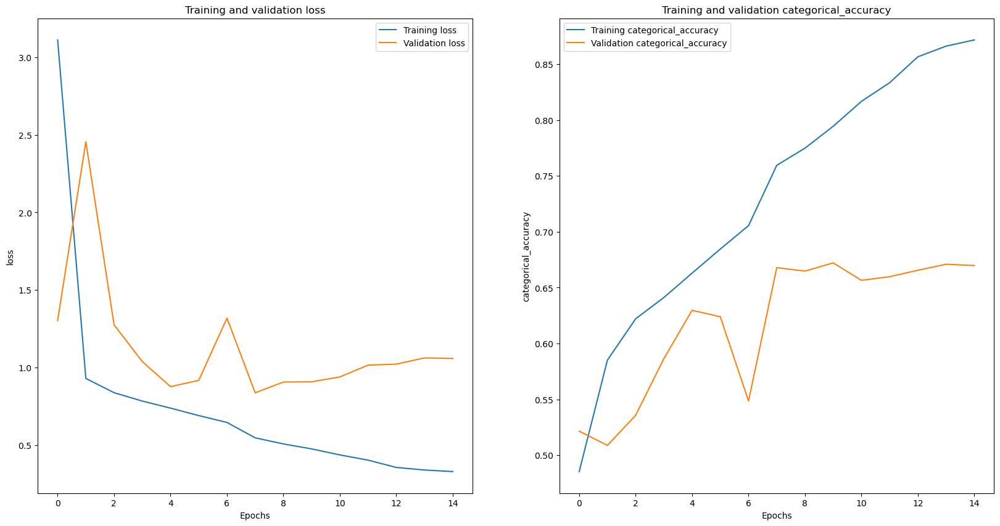

In [27]:
PlotMetrics(BaseClassificationModelHistory,metrics=['loss','categorical_accuracy'])

## ResNet Transfer learning for Classification

In [35]:
#Ref: https://github.com/kennethleungty/TensorFlow-Transfer-Learning-Image-Classification/blob/main/notebooks/TensorFlow%20Tutorial%20-%20Image%20Classification%20on%20Oxford-IIIT%20Pets%20Dataset.ipynb
#Reference: https://datagen.tech/guides/computer-vision/resnet-50/
def ResNetBuilder(Input_size = (256, 256, 3)):
    base_model = keras.applications.resnet_v2.ResNet50V2(
                        include_top=False, 
                        weights='imagenet',
                        input_shape=Input_size
                        )
    base_model.trainable = False
    
    inputs = keras.Input(shape=Input_size)
    x = keras.applications.resnet_v2.preprocess_input(inputs)
    x = base_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)  # Regularize with dropout

    outputs = Dense(7, activation="softmax", name="prediction")(x)

    model = Model(inputs, outputs)
    model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=[keras.metrics.CategoricalAccuracy()])
    return model
    

In [36]:
ResNetModel = ResNetBuilder(Target_model_size)

In [37]:
ResNetModel.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 256, 256, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 256, 256, 3)      0         
 bda)                                                            
                                                                 
 resnet50v2 (Functional)     (None, 8, 8, 2048)        23564800  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [38]:
EPOCHS = 50

ResNetModelhistory = ResNetModel.fit(class_train, epochs=EPOCHS, validation_data=class_val, verbose=1,
                    callbacks =[early_stop, plateau_achieved])

Epoch 1/50
1757/1757 [==============================] - 174s 97ms/step - loss: 1.0585 - categorical_accuracy: 0.5310 - val_loss: 0.9942 - val_categorical_accuracy: 0.5740 - lr: 0.0010
Epoch 2/50
1757/1757 [==============================] - 171s 97ms/step - loss: 1.0021 - categorical_accuracy: 0.5543 - val_loss: 0.9866 - val_categorical_accuracy: 0.5736 - lr: 0.0010
Epoch 3/50
1757/1757 [==============================] - 157s 89ms/step - loss: 0.9959 - categorical_accuracy: 0.5572 - val_loss: 0.9691 - val_categorical_accuracy: 0.5828 - lr: 0.0010
Epoch 4/50
1757/1757 [==============================] - 173s 98ms/step - loss: 0.9855 - categorical_accuracy: 0.5626 - val_loss: 0.9785 - val_categorical_accuracy: 0.5743 - lr: 0.0010
Epoch 5/50
1757/1757 [==============================] - 166s 94ms/step - loss: 0.9827 - categorical_accuracy: 0.5630 - val_loss: 0.9760 - val_categorical_accuracy: 0.5844 - lr: 0.0010
Epoch 6/50
1757/1757 [==============================] - 178s 101ms/step - loss: 

In [39]:
ResNetModelhistoryHistory_df = pd.DataFrame(ResNetModelhistory.history)
BCMH = 'ResNetModelHistory.csv'
with open(BCMH, mode='w') as f:
    ResNetModelhistoryHistory_df.to_csv(f)

In [40]:
ResNetModel.save('./ClassificationModels/ResNetModel.h5')

D:\CoreCodingSw\Anaconda\envs\AIenv\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


In [106]:
# ResNetModel = keras.models.load_model("./ClassificationModels/ResNetModel.h5")

## Training loss and accuracy

In [42]:
ResNetModel.evaluate(class_train)

1757/1757 [==============================] - 138s 78ms/step - loss: 0.9144 - categorical_accuracy: 0.5993


[0.91437828540802, 0.599295437335968]

In [107]:
Pred_class_ResNet = ResNetModel.predict(class_test)
True_class_ResNet = class_test.labels

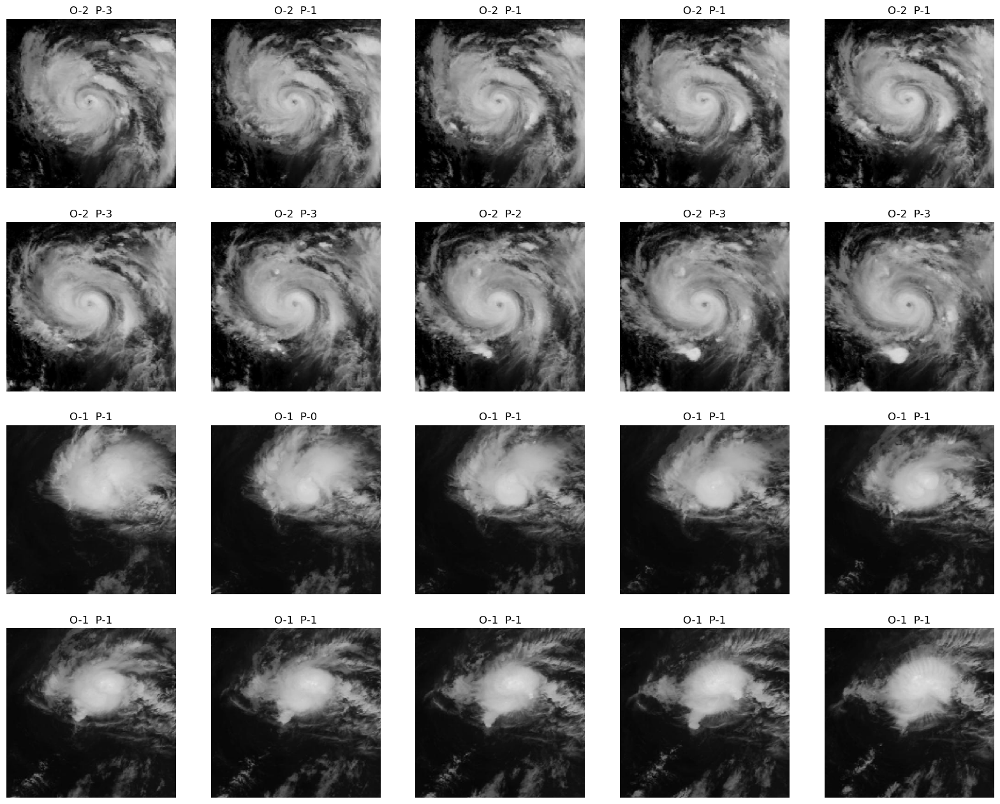

In [122]:
plt.figure(figsize=(20, 20))
addbase=300
for i in range(20):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(5,5, i + 1)
    plt.title("O-"+str(True_class_ResNet[i+addbase])+"  P-"+str(Pred_class_ResNet[i+addbase].argmax()))
    plt.imshow(cur_img)
    plt.axis("off")

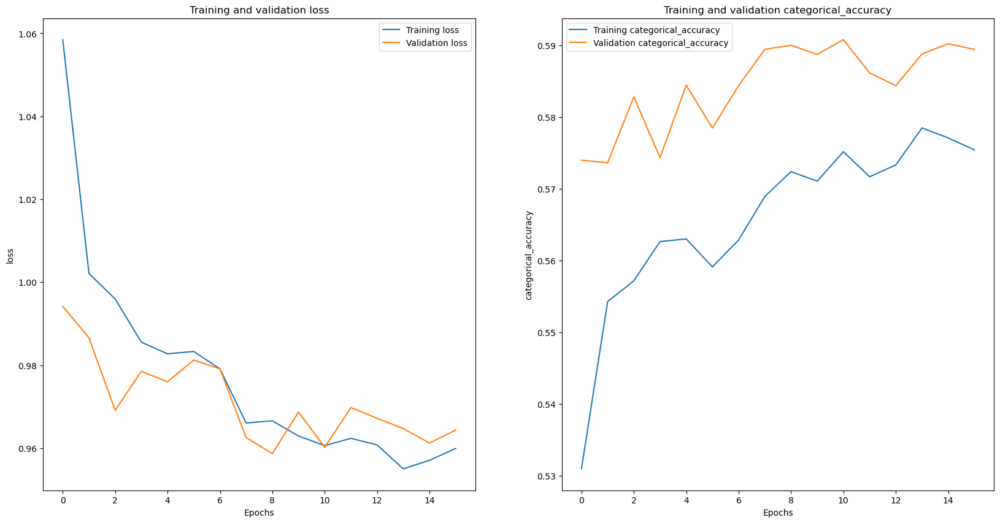

In [47]:
PlotMetrics(ResNetModelhistory,metrics=['loss','categorical_accuracy'])

## VggNet Transfer learning for Classification

In [95]:
#Ref: https://ai.plainenglish.io/vggnet-with-tensorflow-transfer-learning-with-vgg16-included-7e5f6fa9479a
def VggNetBuilder(Input_size = (256, 256, 3)):
    base = tf.keras.applications.VGG16(weights="imagenet", 
                                       include_top=False,
                                       input_tensor=Input(shape=Input_size))
    base.trainable = False

    flatten = base.output
    flatten = Flatten()(flatten)

    bboxHead = Dense(64, activation="relu")(flatten)
    bboxHead = Dense(32, activation="relu")(bboxHead)
    bboxHead = Dense(1, activation="linear")(bboxHead)

    model = Model(inputs=base.input, outputs=bboxHead)
    model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=[keras.metrics.CategoricalAccuracy()])
    return model

In [96]:
VggNetModel = VggNetBuilder()

In [97]:
VggNetModel.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [98]:
VggNetClassificationModelHistory = VggNetModel.fit(
    class_train,
    validation_data=class_val,
    epochs=50,
    callbacks=[early_stop, plateau_achieved]
)

Epoch 1/50
1757/1757 [==============================] - 186s 104ms/step - loss: 1.1921e-07 - categorical_accuracy: 0.4199 - val_loss: 1.1921e-07 - val_categorical_accuracy: 0.4459 - lr: 0.0010
Epoch 2/50
1757/1757 [==============================] - 177s 100ms/step - loss: 1.1921e-07 - categorical_accuracy: 0.4199 - val_loss: 1.1921e-07 - val_categorical_accuracy: 0.4459 - lr: 0.0010
Epoch 3/50
1757/1757 [==============================] - ETA: 0s - loss: 1.1921e-07 - categorical_accuracy: 0.4199
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
1757/1757 [==============================] - 172s 98ms/step - loss: 1.1921e-07 - categorical_accuracy: 0.4199 - val_loss: 1.1921e-07 - val_categorical_accuracy: 0.4459 - lr: 0.0010
Epoch 4/50
1757/1757 [==============================] - 167s 95ms/step - loss: 1.1921e-07 - categorical_accuracy: 0.4199 - val_loss: 1.1921e-07 - val_categorical_accuracy: 0.4459 - lr: 2.0000e-04
Epoch 5/50
1757/1757 [====================

In [99]:
VggNetClassificationModelHistory_df = pd.DataFrame(VggNetClassificationModelHistory.history)
BCMH = 'VggNetModelHistory.csv'
with open(BCMH, mode='w') as f:
    VggNetClassificationModelHistory_df.to_csv(f)

In [53]:
VggNetModel.save('./ClassificationModels/VGG16Model.h5')

In [54]:
#VggNetModelLoad = keras.modelsl.load_model(./ClassificationModels/VGG16Model.h5)

## Training loss and accuracy

In [55]:
VggNetModel.evaluate(class_train)

1757/1757 [==============================] - 149s 85ms/step - loss: 1.1921e-07 - categorical_accuracy: 0.4199


[1.1920930376163597e-07, 0.4198662042617798]

In [142]:
VggNetModel.evaluate(class_test)

44377/44377 [==============================] - 316s 7ms/step - loss: 1.1921e-07 - categorical_accuracy: 0.4823


[1.1920930376163597e-07, 0.48234444856643677]

In [101]:
Pred_class_VggNet = VggNetModel.predict(class_test)
True_class_VggNet = class_test.labels

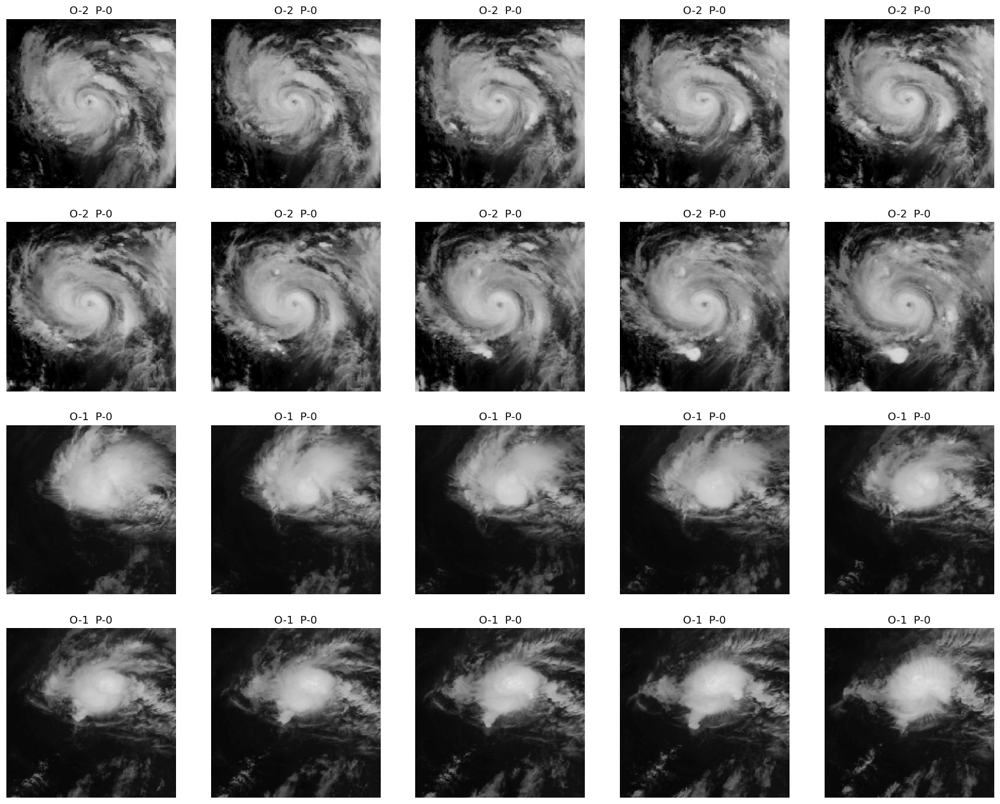

In [121]:
plt.figure(figsize=(20, 20))
addbase=300
for i in range(20):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(5,5, i + 1)
    plt.title("O-"+str(True_class_VggNet[i+addbase])+"  P-"+str(Pred_class_VggNet[i+addbase].argmax()))
    plt.imshow(cur_img)
    plt.axis("off")

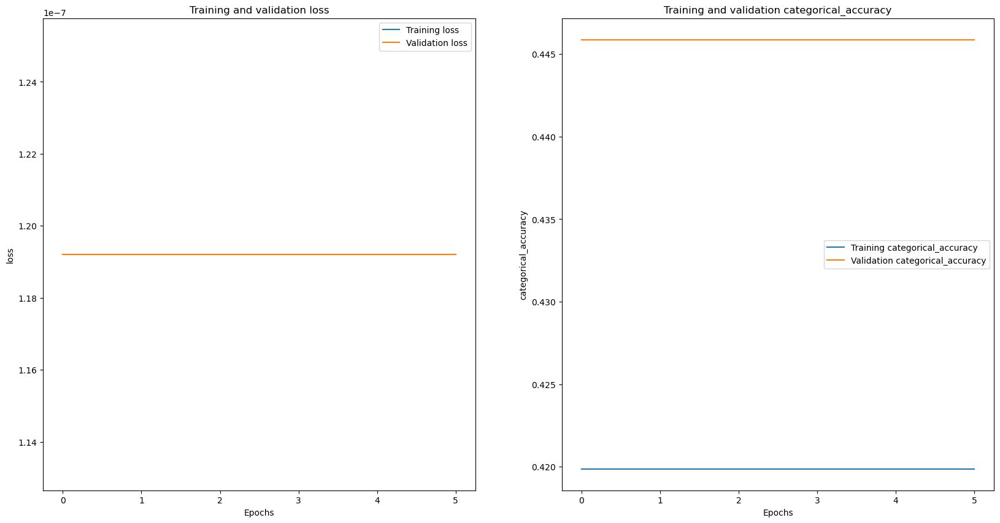

In [58]:
PlotMetrics(VggNetClassificationModelHistory,metrics=['loss','categorical_accuracy'])

# Vgg manual model for classification

In [21]:
#Reference: https://narenltk.medium.com/vgg16-from-scratch-using-transfer-learning-with-keras-and-tensorflow-ffee5ae460fb
def VggManModel(Input_size = (256, 256, 3)):
    ## second_check_class 
    model = Sequential()
    model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu', input_shape=Input_size))
    model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

    model.add(Flatten())
    model.add(Dense(units=4096,activation="relu"))
    model.add(Dense(units=4096,activation="relu"))
    model.add(Dense(units=7, activation="softmax"))

    model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["categorical_accuracy"])
    return model

In [22]:
VggManModel = VggManModel()

In [23]:
VggManModel.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_35 (Conv2D)          (None, 254, 254, 64)      1792      
                                                                 
 conv2d_36 (Conv2D)          (None, 254, 254, 64)      36928     
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 127, 127, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_37 (Conv2D)          (None, 127, 127, 128)     73856     
                                                                 
 conv2d_38 (Conv2D)          (None, 127, 127, 128)     147584    
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 63, 63, 128)      0         
 g2D)                                                 

In [27]:
VggManhistory = VggManModel.fit(
    class_train,
    validation_data=class_val,
    epochs=50,
    callbacks=[early_stop, plateau_achieved]
)

Epoch 1/50
1757/1757 [==============================] - 457s 255ms/step - loss: 1.3450 - categorical_accuracy: 0.4165 - val_loss: 1.3077 - val_categorical_accuracy: 0.4459 - lr: 0.0010
Epoch 2/50
1757/1757 [==============================] - 445s 253ms/step - loss: 1.3334 - categorical_accuracy: 0.4195 - val_loss: 1.3125 - val_categorical_accuracy: 0.4459 - lr: 0.0010
Epoch 3/50
1757/1757 [==============================] - ETA: 0s - loss: 1.3333 - categorical_accuracy: 0.4199
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
1757/1757 [==============================] - 443s 252ms/step - loss: 1.3333 - categorical_accuracy: 0.4199 - val_loss: 1.3019 - val_categorical_accuracy: 0.4459 - lr: 0.0010
Epoch 4/50
1757/1757 [==============================] - 439s 250ms/step - loss: 1.3310 - categorical_accuracy: 0.4199 - val_loss: 1.3025 - val_categorical_accuracy: 0.4459 - lr: 2.0000e-04
Epoch 5/50
1757/1757 [==============================] - ETA: 0s - loss: 1.33

In [28]:
VggManhistoryHistory_df = pd.DataFrame(VggManhistory.history)
BCMH = 'VggManHistory.csv'
with open(BCMH, mode='w') as f:
    VggManhistoryHistory_df.to_csv(f)

In [30]:
VggManModel.save('./ClassificationModels/VggManModel2.h5')

In [31]:
VggManModel.evaluate(class_train)

1757/1757 [==============================] - 139s 79ms/step - loss: 1.3330 - categorical_accuracy: 0.4199


[1.3330284357070923, 0.4198662042617798]

In [ ]:
#VggManload = keras.models.load_model('./ClassificationModels/ClassificationBase2.h5')

In [32]:
Pred_class_VggMan = VggManModel.predict(class_test)
True_class_VggMan = class_test.labels

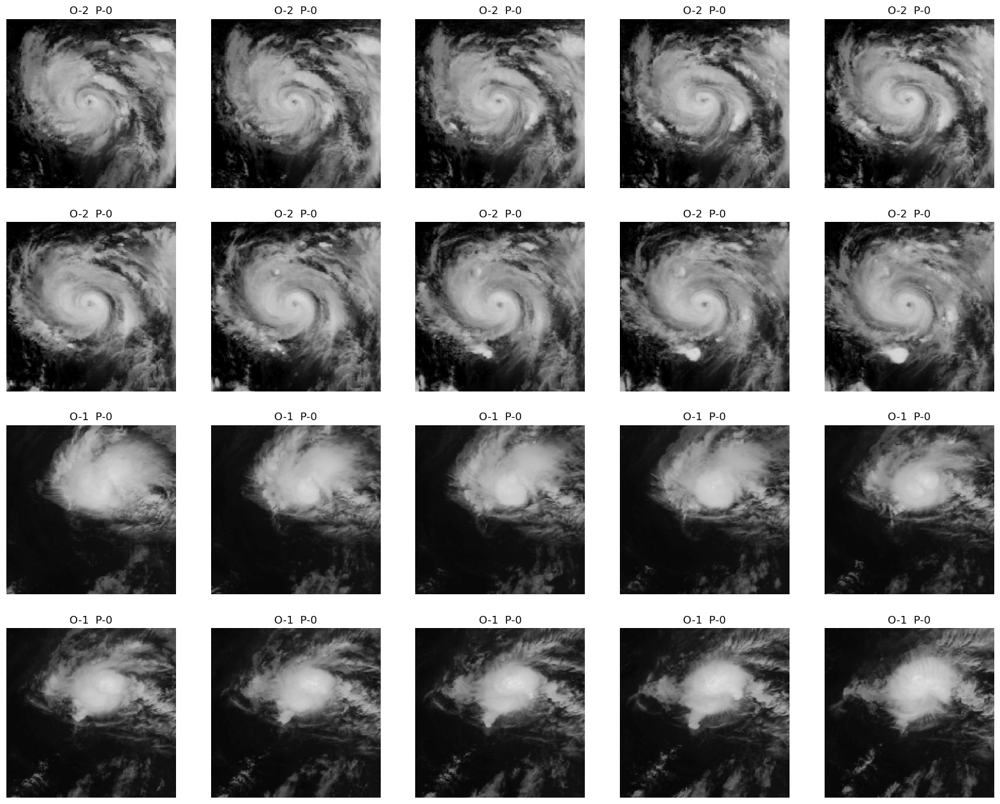

In [120]:
plt.figure(figsize=(20, 20))
addbase=300
for i in range(20):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(5,5, i + 1)
    plt.title("O-"+str(True_class_VggMan[i+addbase])+"  P-"+str(Pred_class_VggMan[i+addbase].argmax()))
    plt.imshow(cur_img)
    plt.axis("off")

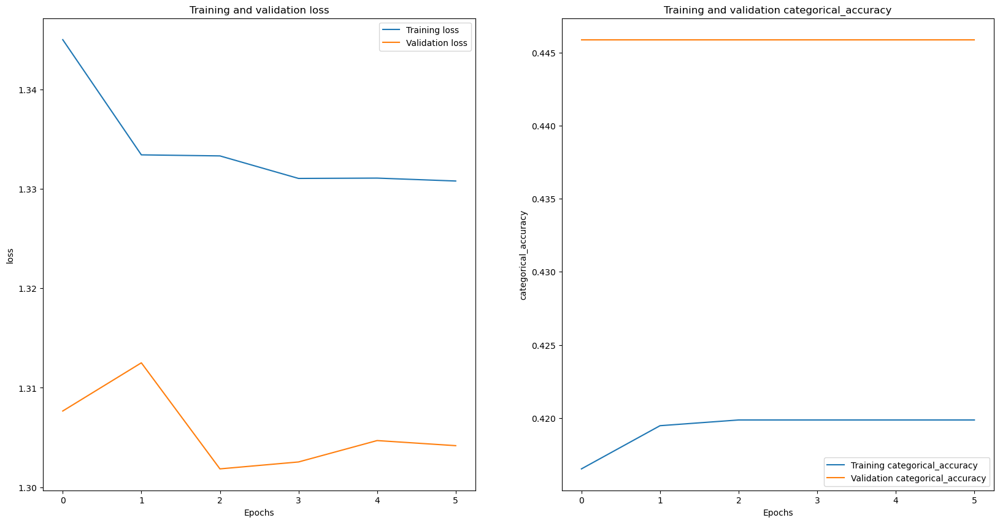

In [38]:
PlotMetrics(VggManhistory,metrics=['loss','categorical_accuracy'])

# Comparative performances for the same Test input 

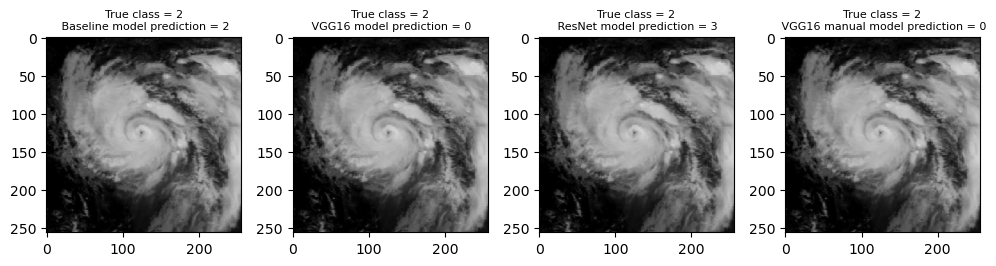

In [112]:
plt.figure(figsize=(10,10))
font = 8
compTmg = 300
plt.subplot(141)
plt.imshow(class_test[compTmg][0][0])
plt.title(f"True class = {class_test.labels[compTmg]}\n Baseline model prediction = {Pred_class_ClassBase[compTmg].argmax()}", fontsize=font)
plt.subplot(142)
plt.imshow(class_test[compTmg][0][0])
plt.title(f"True class = {class_test.labels[compTmg]}\n VGG16 model prediction = {Pred_class_VggNet[compTmg].argmax()}", fontsize=font)
plt.subplot(144)
plt.imshow(class_test[compTmg][0][0])
plt.title(f"True class = {class_test.labels[compTmg]}\n VGG16 manual model prediction = {Pred_class_VggMan[compTmg].argmax()}", fontsize=font)
plt.subplot(143)
plt.imshow(class_test[compTmg][0][0])
plt.title(f"True class = {class_test.labels[compTmg]}\n ResNet model prediction = {Pred_class_ResNet[compTmg].argmax()}", fontsize=font)
plt.tight_layout()

# Regressors for each Class

In [39]:
# https://ntrs.nasa.gov/citations/20205004901
def SpicyCloudBaseModel(Input_size = (256,256,3)):
    model=Sequential()
    model.add(Conv2D(filters=64, kernel_size = (3,3), activation="relu", input_shape=Input_size))
    model.add(Conv2D(filters=64, kernel_size = (3,3), activation="relu"))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization())
    model.add(Conv2D(filters=16, kernel_size = (3,3), activation="relu"))
    model.add(Conv2D(filters=32, kernel_size = (3,3), activation="relu"))
    model.add(MaxPooling2D(pool_size=(2,2)))### some of the parameters are greyed out based on the results obtained.
    model.add(BatchNormalization())    
    model.add(Conv2D(filters=256, kernel_size = (3,3), activation="relu"))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(GlobalAveragePooling2D())
    model.add(Flatten())
    model.add(Dense(126,activation="relu"))
    model.add(Dense(64,activation="relu"))
    model.add(Dense(64,activation="relu"))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mae', metrics=[tf.keras.metrics.RootMeanSquaredError()]) 
    return model

In [40]:
SpicyRegressorClass0 = SpicyCloudBaseModel()
SpicyRegressorClass1 = SpicyCloudBaseModel()
SpicyRegressorClass2 = SpicyCloudBaseModel()
SpicyRegressorClass3 = SpicyCloudBaseModel()
SpicyRegressorClass4 = SpicyCloudBaseModel()
SpicyRegressorClass5 = SpicyCloudBaseModel()
SpicyRegressorClass6 = SpicyCloudBaseModel()

In [41]:
SpicyRegressorClass0.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 254, 254, 64)      1792      
                                                                 
 conv2d_49 (Conv2D)          (None, 252, 252, 64)      36928     
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 126, 126, 64)     0         
 g2D)                                                            
                                                                 
 batch_normalization_14 (Bat  (None, 126, 126, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_50 (Conv2D)          (None, 124, 124, 16)      9232      
                                                                 
 conv2d_51 (Conv2D)          (None, 122, 122, 32)     

# True class splitting based on the Classes

In [42]:
Class_0_train = Train_data[Train_data["wind_speed_class"] == '0'].reset_index(drop=True)
Class_1_train = Train_data[Train_data["wind_speed_class"] == '1'].reset_index(drop=True)
Class_2_train = Train_data[Train_data["wind_speed_class"] == '2'].reset_index(drop=True)
Class_3_train = Train_data[Train_data["wind_speed_class"] == '3'].reset_index(drop=True)
Class_4_train = Train_data[Train_data["wind_speed_class"] == '4'].reset_index(drop=True)
Class_5_train = Train_data[Train_data["wind_speed_class"] == '5'].reset_index(drop=True)
Class_6_train = Train_data[Train_data["wind_speed_class"] == '6'].reset_index(drop=True)

In [137]:
Class_0_test = Test_data[Test_data["wind_speed_class"] == '0'].reset_index(drop=True)
Class_1_test = Test_data[Test_data["wind_speed_class"] == '1'].reset_index(drop=True)
Class_2_test = Test_data[Test_data["wind_speed_class"] == '2'].reset_index(drop=True)
Class_3_test = Test_data[Test_data["wind_speed_class"] == '3'].reset_index(drop=True)
Class_4_test = Test_data[Test_data["wind_speed_class"] == '4'].reset_index(drop=True)
Class_5_test = Test_data[Test_data["wind_speed_class"] == '5'].reset_index(drop=True)
Class_6_test = Test_data[Test_data["wind_speed_class"] == '6'].reset_index(drop=True)

In [140]:
print("number of samples =",Class_0_train['CycloneImageId'].count())
print("number of samples =",Class_1_train['CycloneImageId'].count())
print("number of samples =",Class_2_train['CycloneImageId'].count())
print("number of samples =",Class_3_train['CycloneImageId'].count())
print("number of samples =",Class_4_train['CycloneImageId'].count())
print("number of samples =",Class_5_train['CycloneImageId'].count())
print("number of samples =",Class_6_train['CycloneImageId'].count())

number of samples = 29864
number of samples = 22450
number of samples = 9747
number of samples = 6184
number of samples = 1888
number of samples = 118
number of samples = 6


In [141]:
print("number of samples =",Class_0_test['CycloneImageId'].count())
print("number of samples =",Class_1_test['CycloneImageId'].count())
print("number of samples =",Class_2_test['CycloneImageId'].count())
print("number of samples =",Class_3_test['CycloneImageId'].count())
print("number of samples =",Class_4_test['CycloneImageId'].count())
print("number of samples =",Class_5_test['CycloneImageId'].count())
print("number of samples =",Class_6_test['CycloneImageId'].count())

number of samples = 21405
number of samples = 14173
number of samples = 5162
number of samples = 2887
number of samples = 735
number of samples = 15
number of samples = 0


# Data augmentation for Individual Regressors

In [44]:
#Ref: https://github.com/jeffheaton/t81_558_deep_learning/blob/master/t81_558_class_06_2_cnn.ipynb
def RegressorTrainDataAug(TrainData,TestData,Target_s=(256,256)):
    train_generator = ImageDataGenerator(
        rescale=1./255,
        horizontal_flip=True,
        vertical_flip=True,
        validation_split=0.2)
        
    train_images = train_generator.flow_from_dataframe(
        dataframe=TrainData,
        x_col='ImagePath',
        y_col='Wind_Speed',
        target_size=Target_s,
        color_mode='rgb',
        class_mode='raw',
        zoom_range = 0.01,
        width_shift_range=0.1,
        height_shift_range=0.1,
        batch_size=32,
        shuffle=True,
        seed=42,
        subset='training'
    )

    val_images = train_generator.flow_from_dataframe(
        dataframe=TrainData,
        x_col='ImagePath',
        y_col='Wind_Speed',
        class_mode='raw',
        target_size=Target_s,
        color_mode='rgb', 
        zoom_range = 0.01,
        width_shift_range=0.1,
        batch_size=32,
        shuffle=True,
        seed=42,
        subset='validation'
    )
    print("Train data generated for this class")
    test_generator = ImageDataGenerator(rescale = 1./255)
    
    test_images = test_generator.flow_from_dataframe(
    dataframe=TestData,
    x_col='ImagePath',
    y_col='Wind_Speed',
    target_size=Target_s,
    color_mode='rgb',
    class_mode='raw',
    batch_size=1,
    shuffle=False
    )
    print("Test data generated for this class")
    return train_images,val_images,test_images

In [45]:
Target = (120,120)

In [46]:
Class_aug_t,Class_aug_v,Class_aug_te = RegressorTrainDataAug(Train_data,Test_data,Target)
# Class_1_aug_t,Class_1_aug_v,Class_1_aug_te = RegressorTrainDataAug(Class_1_train,Class_1_test,Target)
# Class_2_aug_t,Class_2_aug_v,Class_2_aug_te = RegressorTrainDataAug(Class_2_train,Class_2_test,Target)
# Class_3_aug_t,Class_3_aug_v,Class_3_aug_te = RegressorTrainDataAug(Class_3_train,Class_3_test,Target)
# Class_4_aug_t,Class_4_aug_v,Class_4_aug_te = RegressorTrainDataAug(Class_4_train,Class_4_test,Target)
# Class_5_aug_t,Class_5_aug_v,Class_5_aug_te = RegressorTrainDataAug(Class_5_train,Class_5_test,Target)
# Class_6_aug_train,Class_6_aug_val,Class_6_aug_test = RegressorTrainDataAug(Class_6_train,Class_6_test,Target_size)

Found 56206 validated image filenames.
Found 14051 validated image filenames.
Train data generated for this class
Found 44377 validated image filenames.
Test data generated for this class


In [47]:
Class_0_aug_train,Class_0_aug_val,Class_0_aug_test = RegressorTrainDataAug(Class_0_train,Class_0_test,Target_size)
Class_1_aug_train,Class_1_aug_val,Class_1_aug_test = RegressorTrainDataAug(Class_1_train,Class_1_test,Target_size)
Class_2_aug_train,Class_2_aug_val,Class_2_aug_test = RegressorTrainDataAug(Class_2_train,Class_2_test,Target_size)
Class_3_aug_train,Class_3_aug_val,Class_3_aug_test = RegressorTrainDataAug(Class_3_train,Class_3_test,Target_size)
Class_4_aug_train,Class_4_aug_val,Class_4_aug_test = RegressorTrainDataAug(Class_4_train,Class_4_test,Target_size)
Class_5_aug_train,Class_5_aug_val,Class_5_aug_test = RegressorTrainDataAug(Class_5_train,Class_5_test,Target_size)
#Class_6_aug_train,Class_6_aug_val,Class_6_aug_test = RegressorTrainDataAug(Class_6_train,Class_6_test,Target_size)

Found 23892 validated image filenames.
Found 5972 validated image filenames.
Train data generated for this class
Found 21405 validated image filenames.
Test data generated for this class
Found 17960 validated image filenames.
Found 4490 validated image filenames.
Train data generated for this class
Found 14173 validated image filenames.
Test data generated for this class
Found 7798 validated image filenames.
Found 1949 validated image filenames.
Train data generated for this class
Found 5162 validated image filenames.
Test data generated for this class
Found 4948 validated image filenames.
Found 1236 validated image filenames.
Train data generated for this class
Found 2887 validated image filenames.
Test data generated for this class
Found 1511 validated image filenames.
Found 377 validated image filenames.
Train data generated for this class
Found 735 validated image filenames.
Test data generated for this class
Found 95 validated image filenames.
Found 23 validated image filenames.
T

In [48]:
early_stop_reg = keras.callbacks.EarlyStopping(
        monitor="val_root_mean_squared_error",
    ## Stopping by 5 epochs
        patience=5,
        verbose=1,
    ## We will set the paramters of epoch where the minimum validation rmse was obtained 
        mode="min",
        restore_best_weights=True 
     )

## Similarly we use ReduceLROnPlateau as an early stopping way :

plateau_achieved_reg = keras.callbacks.ReduceLROnPlateau(
        monitor="val_root_mean_squared_error",
        factor=0.2,
        patience=2,
        verbose=1,
        mode="min",
        min_lr=0.00001,
     )

# Regressor models training

In [49]:
def RegressorTraining(TrainingModel,TrainData,ValData,epochs=50):
    print("Starting the training for {}".format(TrainingModel))
    Regressor = TrainingModel.fit(
        TrainData,
        validation_data=ValData,
        epochs=epochs,
        callbacks=[early_stop_reg, plateau_achieved_reg]
    )
    return TrainingModel,Regressor

# Individual Regressor model trainings

In [50]:
Class0RegressionModel,Class0RegressionHistory =RegressorTraining(SpicyRegressorClass0,Class_0_aug_train,Class_0_aug_val)

Starting the training for <keras.engine.sequential.Sequential object at 0x0000023584072EB0>
Epoch 1/50
747/747 [==============================] - 81s 106ms/step - loss: 4.2668 - root_mean_squared_error: 5.6689 - val_loss: 4.2935 - val_root_mean_squared_error: 5.2967 - lr: 0.0010
Epoch 2/50
747/747 [==============================] - 81s 108ms/step - loss: 3.8112 - root_mean_squared_error: 4.7263 - val_loss: 3.5373 - val_root_mean_squared_error: 4.3751 - lr: 0.0010
Epoch 3/50
747/747 [==============================] - 84s 113ms/step - loss: 3.7777 - root_mean_squared_error: 4.6947 - val_loss: 3.7676 - val_root_mean_squared_error: 4.6847 - lr: 0.0010
Epoch 4/50
747/747 [==============================] - ETA: 0s - loss: 3.7089 - root_mean_squared_error: 4.6124
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
747/747 [==============================] - 80s 107ms/step - loss: 3.7089 - root_mean_squared_error: 4.6124 - val_loss: 3.6295 - val_root_mean_squared_er

In [51]:
Class1RegressionModel,Class1RegressionHistory =RegressorTraining(SpicyRegressorClass1,Class_1_aug_train,Class_1_aug_val)

Starting the training for <keras.engine.sequential.Sequential object at 0x0000023584072E50>
Epoch 1/50
562/562 [==============================] - 65s 114ms/step - loss: 6.9691 - root_mean_squared_error: 10.1912 - val_loss: 8.3042 - val_root_mean_squared_error: 10.3024 - lr: 0.0010
Epoch 2/50
562/562 [==============================] - 61s 109ms/step - loss: 5.7693 - root_mean_squared_error: 6.9615 - val_loss: 5.3991 - val_root_mean_squared_error: 6.6526 - lr: 0.0010
Epoch 3/50
562/562 [==============================] - 60s 107ms/step - loss: 5.7514 - root_mean_squared_error: 6.9599 - val_loss: 5.5201 - val_root_mean_squared_error: 6.7715 - lr: 0.0010
Epoch 4/50
562/562 [==============================] - ETA: 0s - loss: 5.6526 - root_mean_squared_error: 6.8262
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
562/562 [==============================] - 64s 113ms/step - loss: 5.6526 - root_mean_squared_error: 6.8262 - val_loss: 5.8610 - val_root_mean_squared_

In [52]:
Class2RegressionModel,Class2RegressionHistory = RegressorTraining(SpicyRegressorClass2,Class_2_aug_train,Class_2_aug_val)

Starting the training for <keras.engine.sequential.Sequential object at 0x0000023584072C70>
Epoch 1/50
244/244 [==============================] - 28s 111ms/step - loss: 10.4052 - root_mean_squared_error: 17.4493 - val_loss: 10.3087 - val_root_mean_squared_error: 12.7735 - lr: 0.0010
Epoch 2/50
244/244 [==============================] - 28s 114ms/step - loss: 6.4668 - root_mean_squared_error: 7.7317 - val_loss: 6.8480 - val_root_mean_squared_error: 8.3594 - lr: 0.0010
Epoch 3/50
244/244 [==============================] - 26s 105ms/step - loss: 6.6961 - root_mean_squared_error: 8.0459 - val_loss: 6.9356 - val_root_mean_squared_error: 8.2314 - lr: 0.0010
Epoch 4/50
244/244 [==============================] - 28s 114ms/step - loss: 6.7173 - root_mean_squared_error: 8.0956 - val_loss: 6.7052 - val_root_mean_squared_error: 7.9041 - lr: 0.0010
Epoch 5/50
244/244 [==============================] - 28s 114ms/step - loss: 6.4861 - root_mean_squared_error: 7.7703 - val_loss: 36.9624 - val_root_mea

In [53]:
Class3RegressionModel,Class3RegressionHistory = RegressorTraining(SpicyRegressorClass3,Class_3_aug_train,Class_3_aug_val)

Starting the training for <keras.engine.sequential.Sequential object at 0x00000235840C8FD0>
Epoch 1/50
155/155 [==============================] - 20s 122ms/step - loss: 16.6285 - root_mean_squared_error: 29.9106 - val_loss: 45.1914 - val_root_mean_squared_error: 46.3948 - lr: 0.0010
Epoch 2/50
155/155 [==============================] - 17s 106ms/step - loss: 8.0535 - root_mean_squared_error: 9.6709 - val_loss: 17.5993 - val_root_mean_squared_error: 20.0994 - lr: 0.0010
Epoch 3/50
155/155 [==============================] - 16s 106ms/step - loss: 7.9850 - root_mean_squared_error: 9.5468 - val_loss: 9.5281 - val_root_mean_squared_error: 11.9901 - lr: 0.0010
Epoch 4/50
155/155 [==============================] - 17s 106ms/step - loss: 7.9724 - root_mean_squared_error: 9.5887 - val_loss: 8.5767 - val_root_mean_squared_error: 10.0927 - lr: 0.0010
Epoch 5/50
155/155 [==============================] - 16s 106ms/step - loss: 7.8231 - root_mean_squared_error: 9.3116 - val_loss: 8.1711 - val_root_

155/155 [==============================] - 17s 106ms/step - loss: 6.3916 - root_mean_squared_error: 7.7200 - val_loss: 7.0768 - val_root_mean_squared_error: 9.0878 - lr: 1.0000e-05
Epoch 00040: early stopping


In [54]:
Class4RegressionModel,Class4RegressionHistory = RegressorTraining(SpicyRegressorClass4,Class_4_aug_train,Class_4_aug_val)

Starting the training for <keras.engine.sequential.Sequential object at 0x0000023598437880>
Epoch 1/50
48/48 [==============================] - 7s 136ms/step - loss: 48.2252 - root_mean_squared_error: 69.3317 - val_loss: 103.1616 - val_root_mean_squared_error: 103.5556 - lr: 0.0010
Epoch 2/50
48/48 [==============================] - 5s 109ms/step - loss: 6.7764 - root_mean_squared_error: 8.7169 - val_loss: 80.3181 - val_root_mean_squared_error: 81.0211 - lr: 0.0010
Epoch 3/50
48/48 [==============================] - 5s 108ms/step - loss: 6.7505 - root_mean_squared_error: 8.6643 - val_loss: 55.5790 - val_root_mean_squared_error: 56.7001 - lr: 0.0010
Epoch 4/50
48/48 [==============================] - 5s 108ms/step - loss: 5.9795 - root_mean_squared_error: 7.8439 - val_loss: 62.5168 - val_root_mean_squared_error: 63.0740 - lr: 0.0010
Epoch 5/50
48/48 [==============================] - 5s 107ms/step - loss: 6.6455 - root_mean_squared_error: 8.5464 - val_loss: 22.5321 - val_root_mean_squar

In [55]:
Class5RegressionModel,Class5RegressionHistory = RegressorTraining(SpicyRegressorClass5,Class_5_aug_train,Class_5_aug_val)

Starting the training for <keras.engine.sequential.Sequential object at 0x0000023595FADA30>
Epoch 1/50
3/3 [==============================] - 3s 957ms/step - loss: 154.1101 - root_mean_squared_error: 154.1850 - val_loss: 174.4756 - val_root_mean_squared_error: 174.7554 - lr: 0.0010
Epoch 2/50
3/3 [==============================] - 0s 144ms/step - loss: 152.5431 - root_mean_squared_error: 152.6192 - val_loss: 173.9058 - val_root_mean_squared_error: 174.1866 - lr: 0.0010
Epoch 3/50
3/3 [==============================] - 0s 150ms/step - loss: 149.1473 - root_mean_squared_error: 149.2217 - val_loss: 172.4651 - val_root_mean_squared_error: 172.7483 - lr: 0.0010
Epoch 4/50
3/3 [==============================] - 0s 134ms/step - loss: 142.1977 - root_mean_squared_error: 142.2865 - val_loss: 168.3722 - val_root_mean_squared_error: 168.6630 - lr: 0.0010
Epoch 5/50
3/3 [==============================] - 0s 142ms/step - loss: 128.6352 - root_mean_squared_error: 128.7966 - val_loss: 161.5252 - val_

In [56]:
#Class6RegressionModel,Class6RegressionHistory = RegressorTraining(SpicyRegressorClass6,Class_6_aug_train,Class_6_aug_val)

# Model RMSE evaluation

In [156]:
def ModelEvaluation(TrainedModel,Traindata,TestData=None):
    rmse = TrainedModel.evaluate(Traindata)
    print("Train RMSE: {}".format(rmse))

    if type(TestData) == keras.preprocessing.image.DataFrameIterator:
        rmse = TrainedModel.evaluate(TestData)
        print("Test RMSE: {}".format(rmse))
        print("|==============================|")
    return
        

In [157]:
ModelEvaluation(Class0RegressionModel,Class_0_aug_train,Class_0_aug_test)
ModelEvaluation(Class1RegressionModel,Class_1_aug_train,Class_1_aug_test)
ModelEvaluation(Class2RegressionModel,Class_2_aug_train,Class_2_aug_test)
ModelEvaluation(Class3RegressionModel,Class_3_aug_train,Class_3_aug_test)
ModelEvaluation(Class4RegressionModel,Class_4_aug_train,Class_4_aug_test)
ModelEvaluation(Class5RegressionModel,Class_5_aug_train,Class_5_aug_test)
#ModelEvaluation(Class6RegressionModel,Class_6_aug_train)

747/747 [==============================] - 58s 78ms/step - loss: 3.4775 - root_mean_squared_error: 4.3547
Train RMSE: [3.477548122406006, 4.3547234535217285]
21405/21405 [==============================] - 83s 4ms/step - loss: 3.6514 - root_mean_squared_error: 4.5013
Test RMSE: [3.651442050933838, 4.501297950744629]
|==============================|
562/562 [==============================] - 51s 91ms/step - loss: 5.3356 - root_mean_squared_error: 6.3853
Train RMSE: [5.3356170654296875, 6.385257244110107]
14173/14173 [==============================] - 56s 4ms/step - loss: 5.4994 - root_mean_squared_error: 6.6271
Test RMSE: [5.499387264251709, 6.627137184143066]
|==============================|
244/244 [==============================] - 18s 74ms/step - loss: 6.1593 - root_mean_squared_error: 7.3287
Train RMSE: [6.159283638000488, 7.328721046447754]
5162/5162 [==============================] - 21s 4ms/step - loss: 6.1163 - root_mean_squared_error: 7.2476
Test RMSE: [6.116291522979736, 7.247

In [61]:
def HistoryRecorder(modelHists):
    for i,models in enumerate(modelHists):
        modelhist_df = pd.DataFrame(VggManhistory.history)
        BCMH = f'./EnsembleModels/Class{i}RegressionHistory.csv'
        with open(BCMH, mode='w') as f:
            modelhist_df.to_csv(f)
    return

In [62]:
histmodels = [Class0RegressionHistory.history,
             Class1RegressionHistory.history,
             Class2RegressionHistory.history,
             Class3RegressionHistory.history,
             Class4RegressionHistory.history,
             Class5RegressionHistory.history]

HistoryRecorder(histmodels)

In [63]:
def ModelViz(ModelHistory):
    plt.figure(figsize=(20,8))
    plt.subplot(121)
    plt.plot(ModelHistory.history['root_mean_squared_error'], label='Training rmse')
    plt.plot(ModelHistory.history['val_root_mean_squared_error'], label='Validation rmse')
    plt.title('Training and validation rmse')
    plt.xlabel('Epochs')
    plt.ylabel('rmse')
    plt.subplot(122)
    plt.plot(ModelHistory.history['loss'], label='Training loss')
    plt.plot(ModelHistory.history['val_loss'], label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()

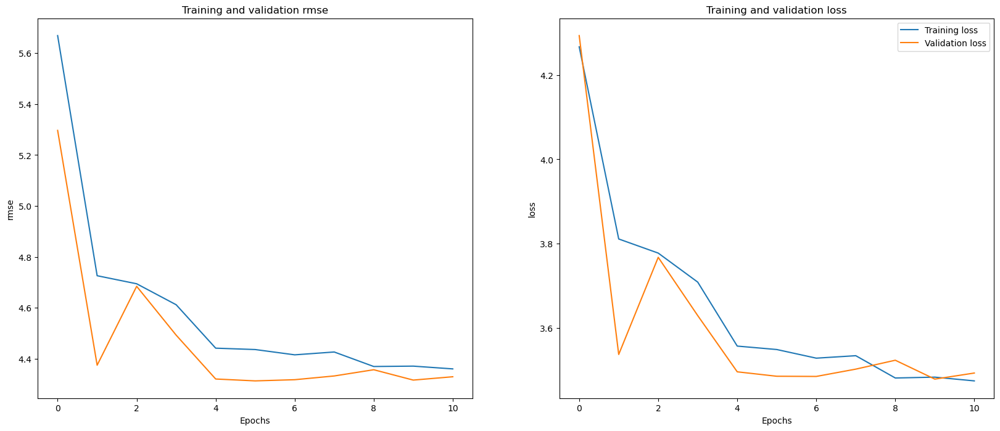

In [64]:
ModelViz(Class0RegressionHistory)

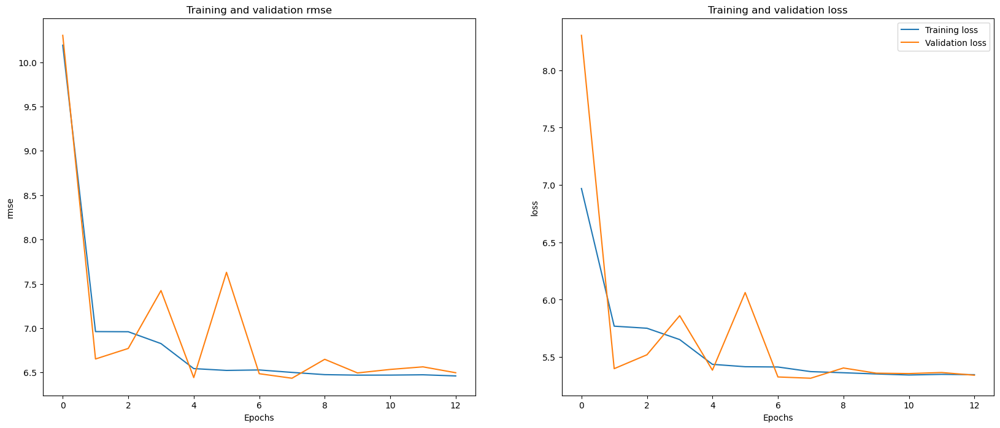

In [65]:
ModelViz(Class1RegressionHistory)

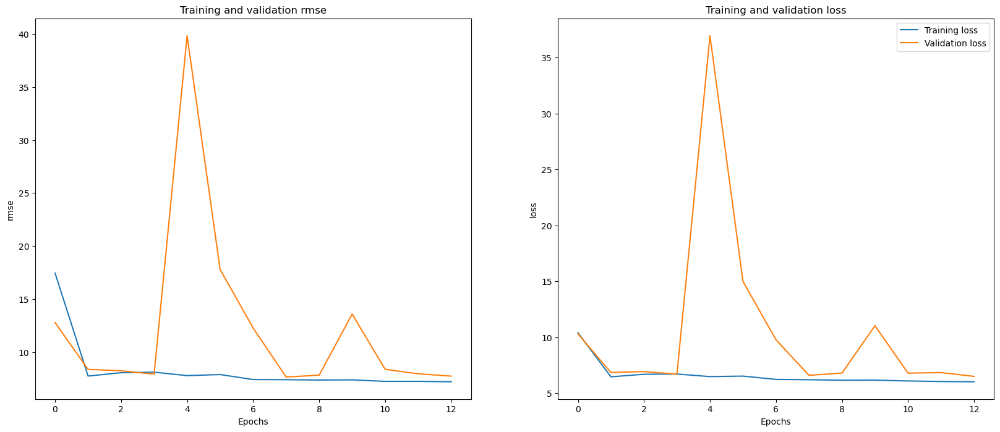

In [66]:
ModelViz(Class2RegressionHistory)

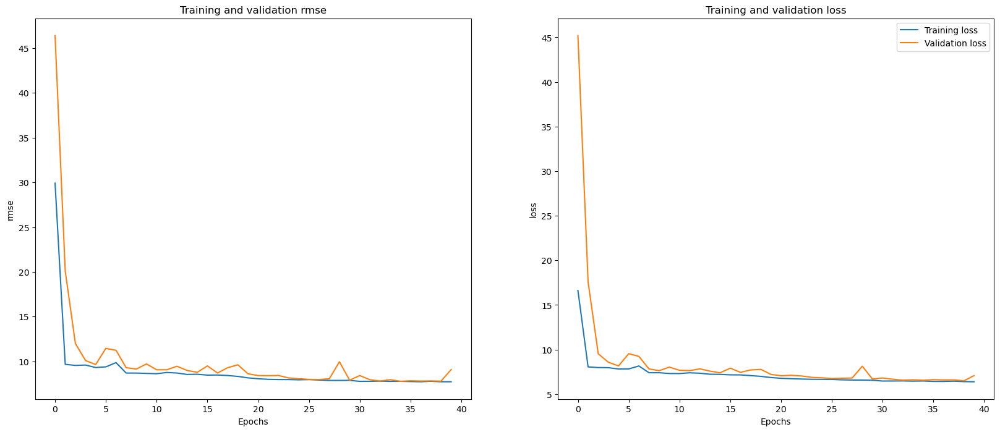

In [67]:
ModelViz(Class3RegressionHistory)

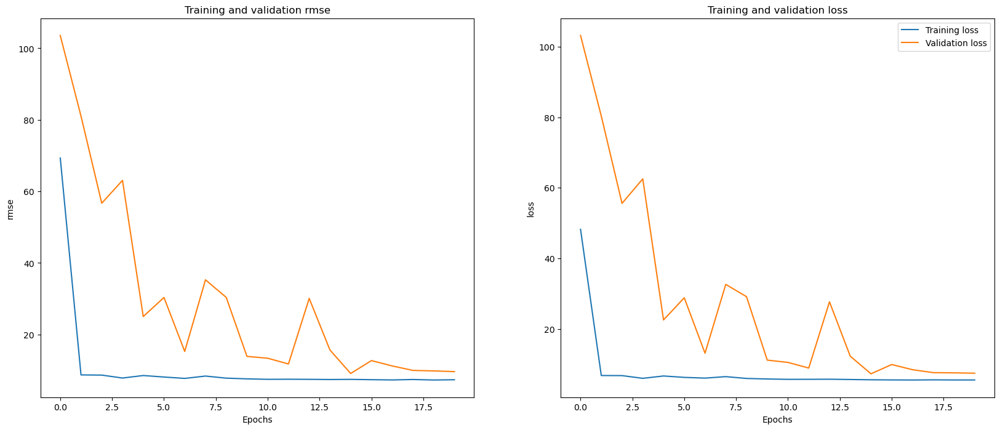

In [68]:
ModelViz(Class4RegressionHistory)

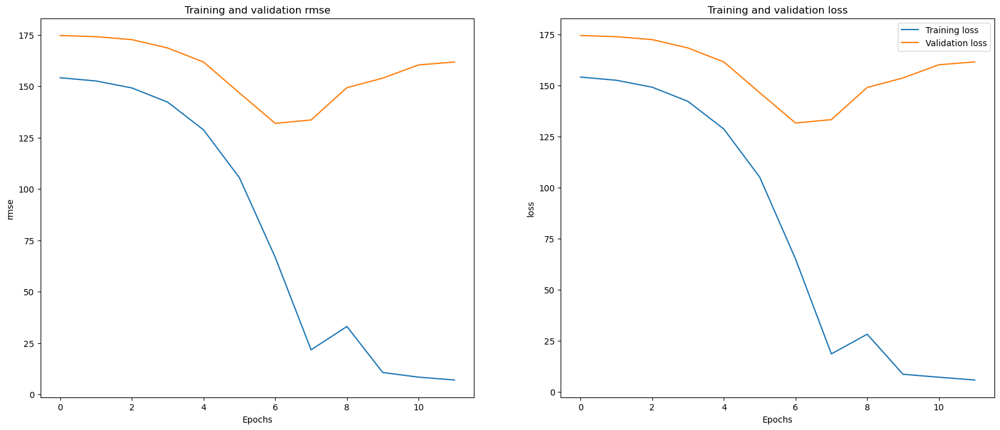

In [69]:
ModelViz(Class5RegressionHistory)

In [70]:
#ModelViz(Class6RegressionHistory)

In [71]:
Class0RegressionModel.save('./EnsembleModels/Class0RegressionModel.h5')
Class1RegressionModel.save('./EnsembleModels/Class1RegressionModel.h5')
Class2RegressionModel.save('./EnsembleModels/Class2RegressionModel.h5')
Class3RegressionModel.save('./EnsembleModels/Class3RegressionModel.h5')
Class4RegressionModel.save('./EnsembleModels/Class4RegressionModel.h5')
Class5RegressionModel.save('./EnsembleModels/Class5RegressionModel.h5')
#Class6RegressionModel.save('./EnsembleModels/Class6RegressionModel.h5')

In [72]:
# Class0Model = SpicyCloudBaseModel()
# Class1Model = SpicyCloudBaseModel()
# Class2Model = SpicyCloudBaseModel()
# Class3Model = SpicyCloudBaseModel()
# Class4Model = SpicyCloudBaseModel()
# Class5Model = SpicyCloudBaseModel()
# Class6Model = SpicyCloudBaseModel()


# Class0Model.load_weights('./EnsembleModels/Class0RegressionModel.h5')
# Class1Model.load_weights('./EnsembleModels/Class1RegressionModel.h5')
# Class2Model.load_weights('./EnsembleModels/Class2RegressionModel.h5')
# Class3Model.load_weights('./EnsembleModels/Class3RegressionModel.h5')
# Class4Model.load_weights('./EnsembleModels/Class4RegressionModel.h5')
# Class5Model.load_weights('./EnsembleModels/Class5RegressionModel.h5')
# Class6Model.load_weights('./EnsembleModels/Class6RegressionModel.h5')


In [73]:
predictions_r0 = Class0RegressionModel.predict(Class_0_aug_test)
predictions_r1 = Class1RegressionModel.predict(Class_1_aug_test)
predictions_r2 = Class2RegressionModel.predict(Class_2_aug_test)
predictions_r3 = Class3RegressionModel.predict(Class_3_aug_test)
predictions_r4 = Class4RegressionModel.predict(Class_4_aug_test)
predictions_r5 = Class5RegressionModel.predict(Class_5_aug_test)
True_r0 = Class_0_aug_test.labels
True_r1 = Class_1_aug_test.labels
True_r2 = Class_2_aug_test.labels
True_r3 = Class_3_aug_test.labels
True_r4 = Class_4_aug_test.labels
True_r5 = Class_5_aug_test.labels
#True_r6 = Class_6_aug_test.labels
#predictions_r4 = Class6RegressionModel.predict(Class_6_aug_test)

# Regressor performance examples

## Class 0 sample

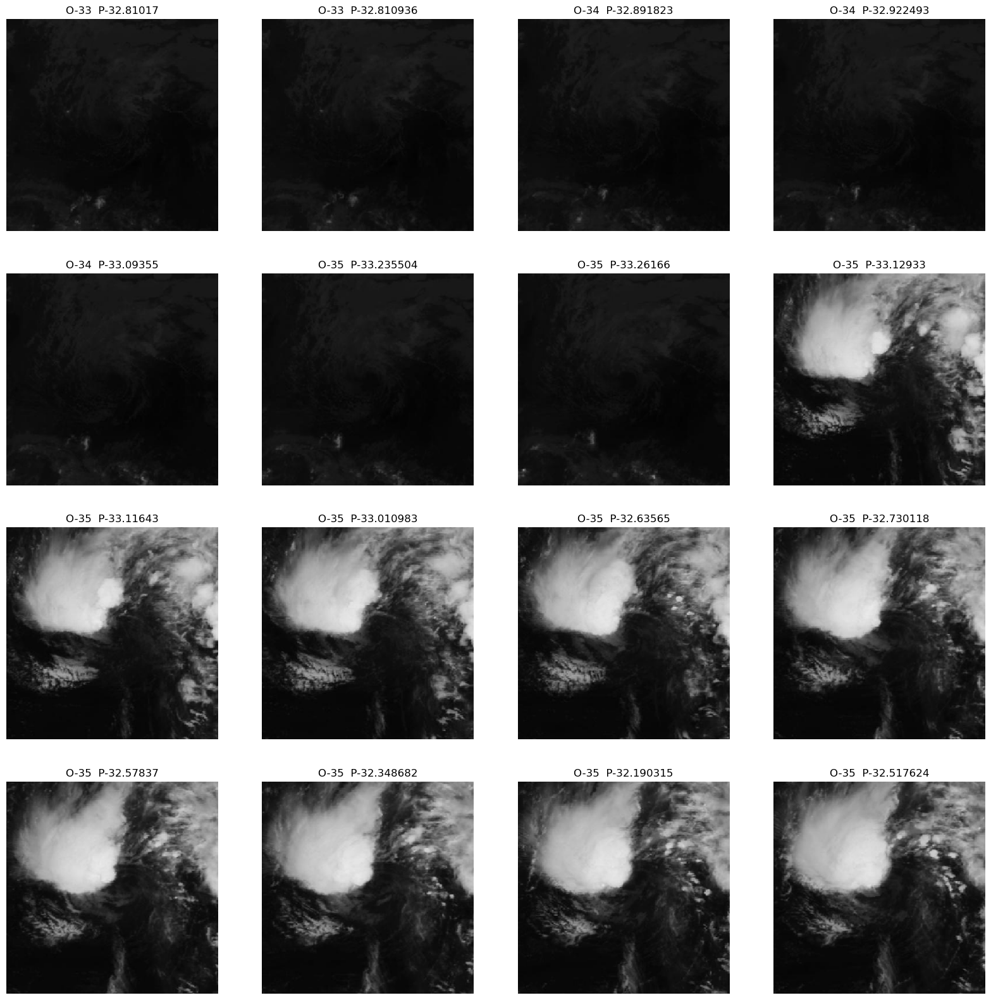

In [148]:
plt.figure(figsize=(20, 20))
addbase=7000
for i in range(16):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(4,4, i + 1)
    plt.title("O-"+str(True_r0[i+addbase])+"  P-"+str(predictions_r0[i+addbase][0]))
    plt.imshow(cur_img)
    plt.axis("off")

## Class 1 sample

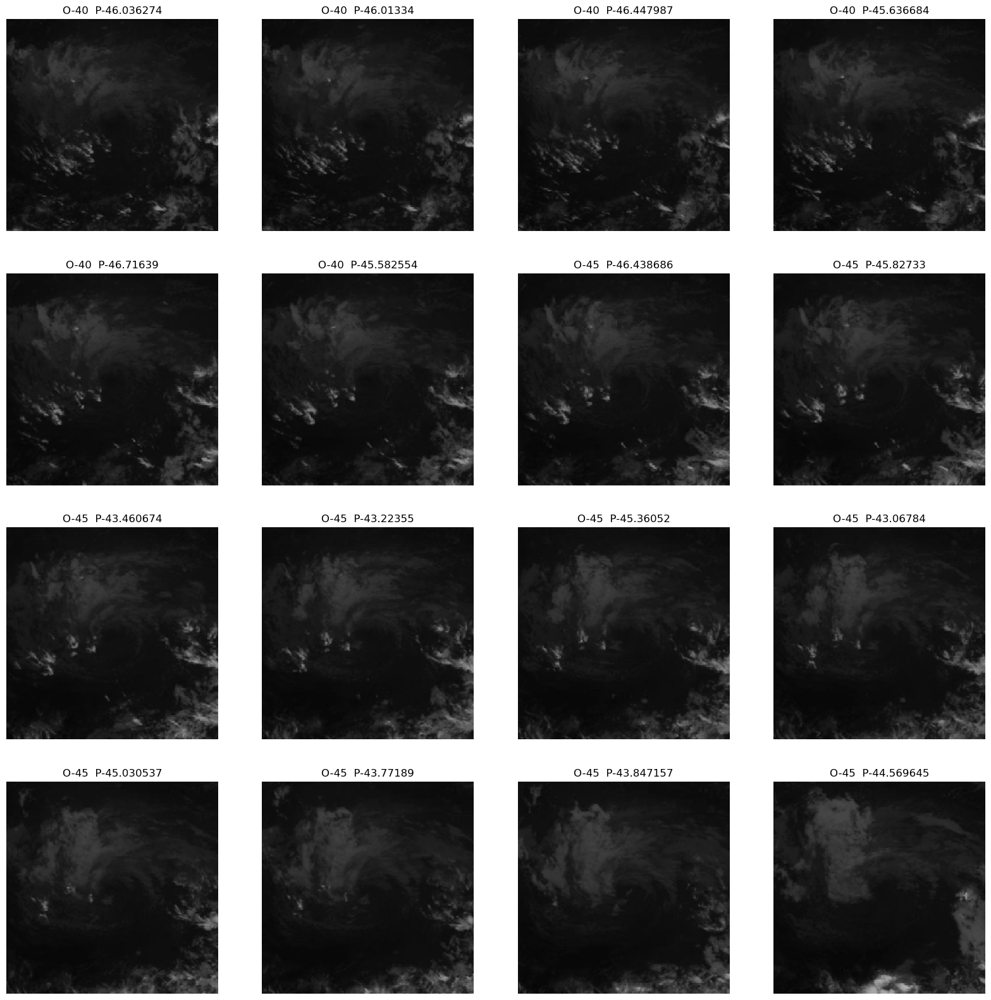

In [149]:
plt.figure(figsize=(20, 20))
addbase=0
for i in range(16):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(4,4, i + 1)
    plt.title("O-"+str(True_r1[i+addbase])+"  P-"+str(predictions_r1[i+addbase][0]))
    plt.imshow(cur_img)
    plt.axis("off")

## Class 2 sample

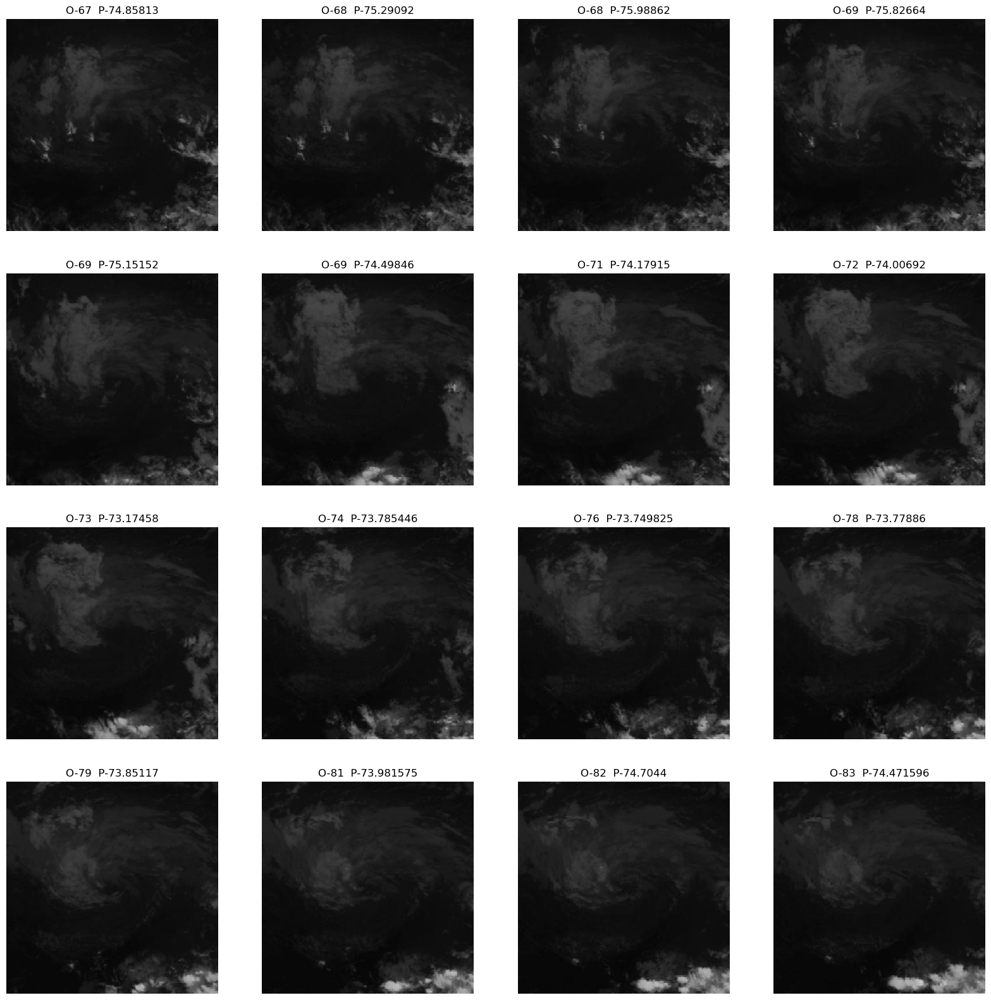

In [150]:
plt.figure(figsize=(20, 20))
addbase=10
for i in range(16):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(4,4, i + 1)
    plt.title("O-"+str(True_r2[i+addbase])+"  P-"+str(predictions_r2[i+addbase][0]))
    plt.imshow(cur_img)
    plt.axis("off")

## Class 3 sample

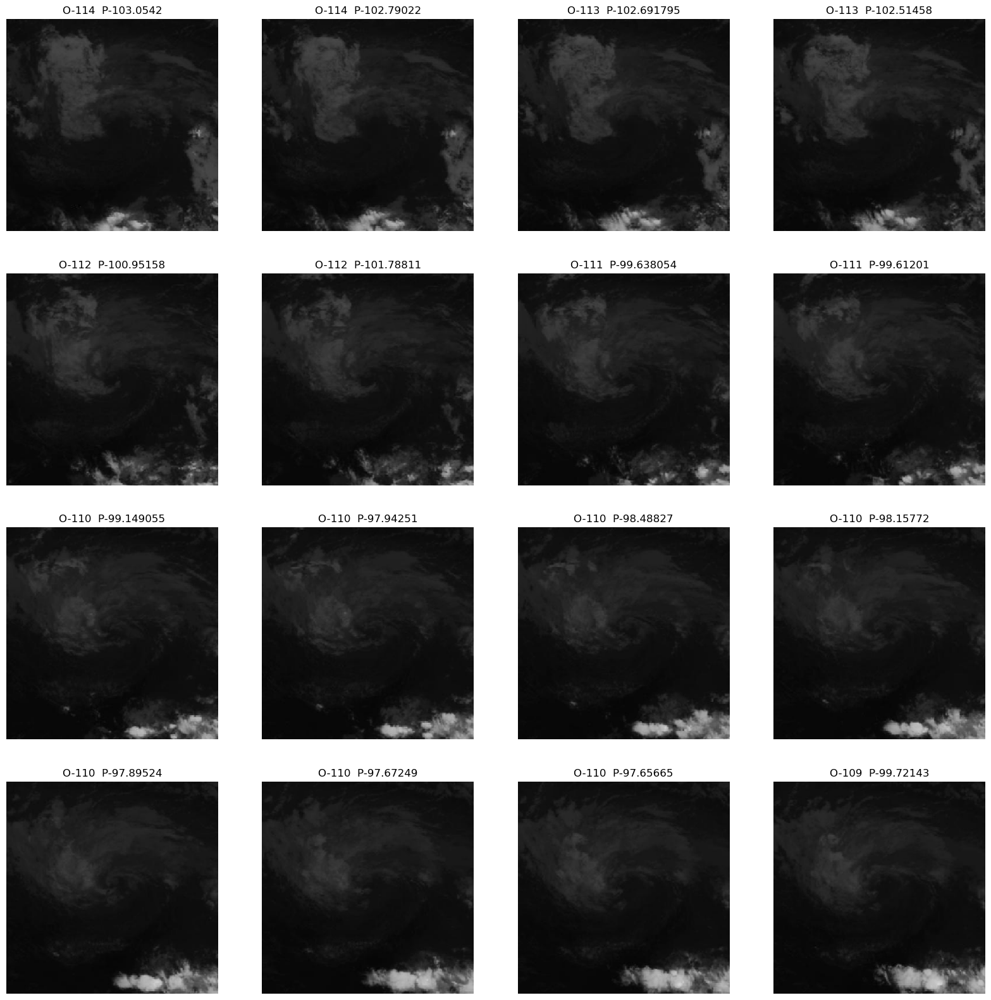

In [151]:
plt.figure(figsize=(20, 20))
addbase=15
for i in range(16):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(4,4, i + 1)
    plt.title("O-"+str(True_r3[i+addbase])+"  P-"+str(predictions_r3[i+addbase][0]))
    plt.imshow(cur_img)
    plt.axis("off")

## Class 4 sample

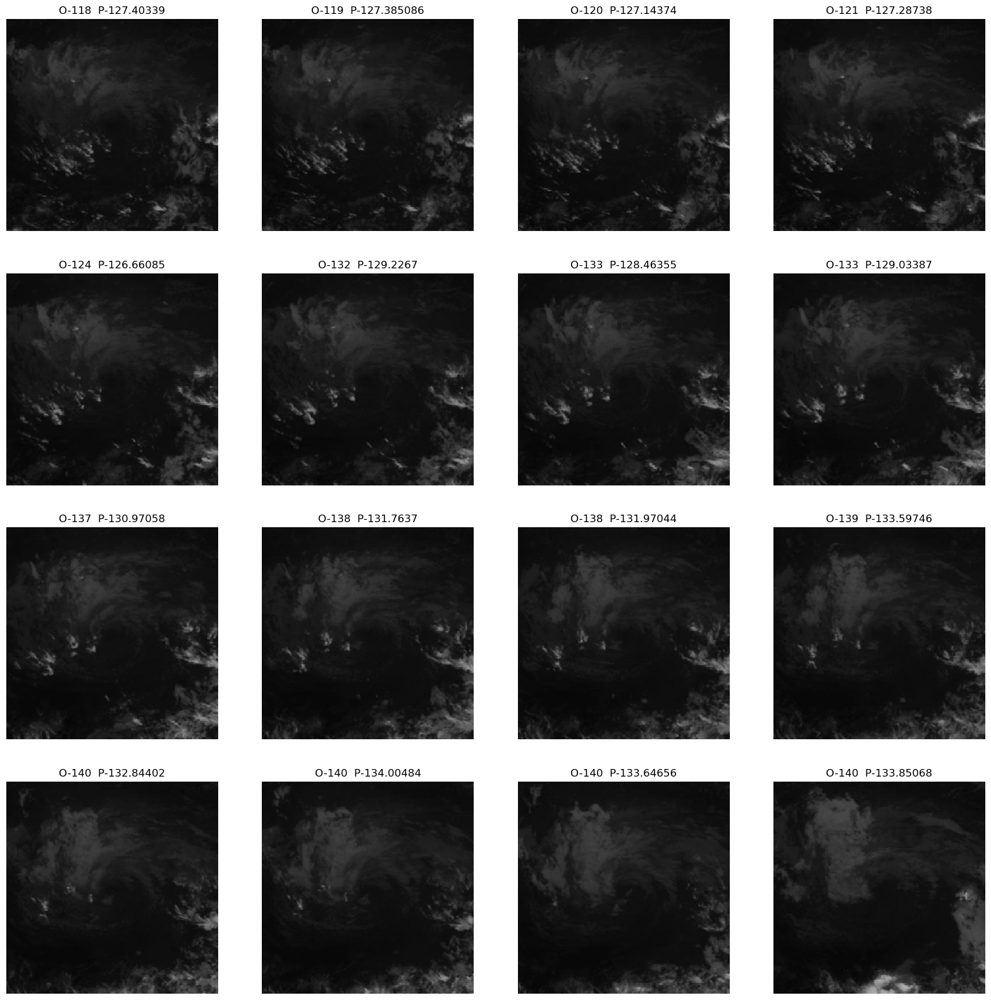

In [152]:
plt.figure(figsize=(20, 20))
addbase=0
for i in range(16):
    cur_img = class_test[i+addbase][0][0]
    ax = plt.subplot(4,4, i + 1)
    plt.title("O-"+str(True_r4[i+addbase])+"  P-"+str(predictions_r4[i+addbase][0]))
    plt.imshow(cur_img)
    plt.axis("off")

## Class 5 sample

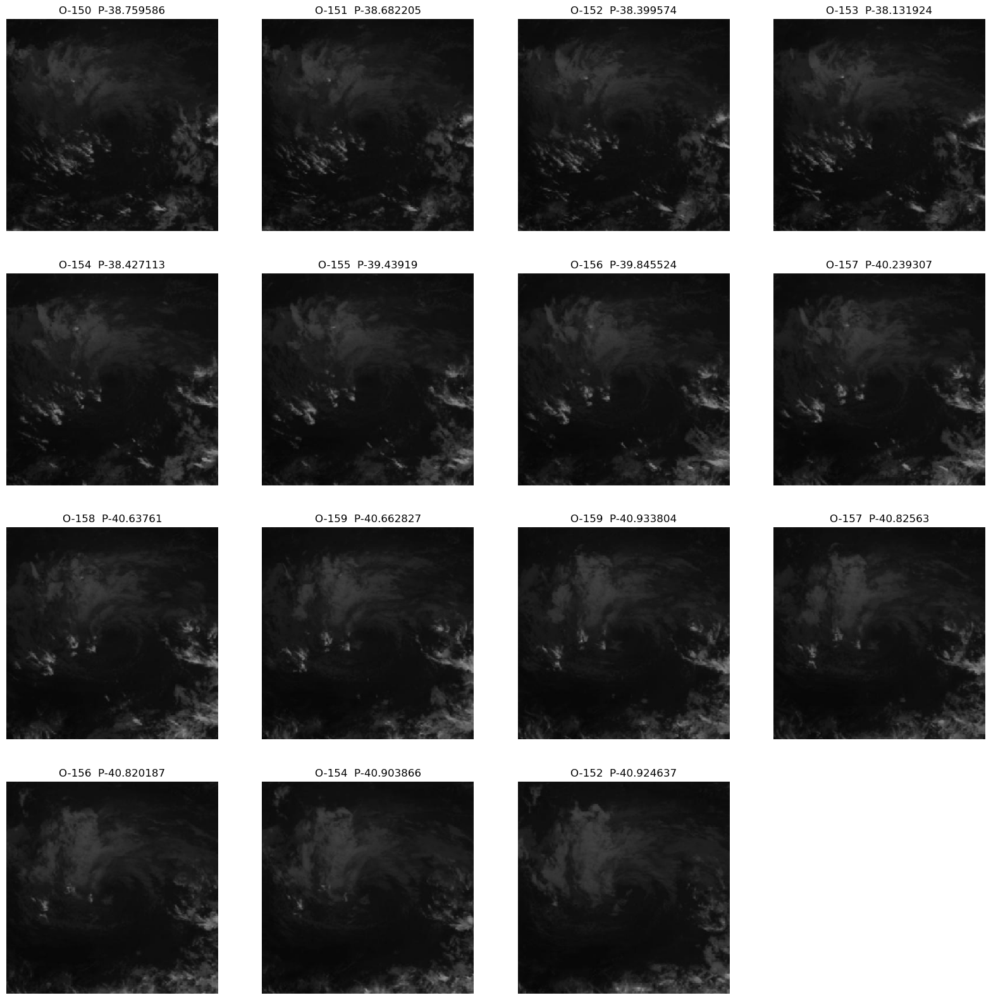

In [153]:
plt.figure(figsize=(20, 20))
addbase=0
for i in range(15):
    try:
        cur_img = class_test[i+addbase][0][0]
        ax = plt.subplot(4,4, i + 1)
        plt.title("O-"+str(True_r5[i+addbase])+"  P-"+str(predictions_r5[i+addbase][0]))
        plt.imshow(cur_img)
        plt.axis("off")
    except:
        continue

# Pure Regression model vs Class regressor model comparison

In [80]:
BaseRegModel = keras.models.load_model('model_base.h5')

test_generator = ImageDataGenerator(rescale = 1./255)
    
test_images = test_generator.flow_from_dataframe(
dataframe=Class_2_test,
x_col='ImagePath',
y_col='Wind_Speed',
target_size=(120,120),
color_mode='rgb',
class_mode='raw',
batch_size=1,
shuffle=False
)

preds_BaseModel = BaseRegModel.predict(test_images)
labels = test_images.labels

Found 5162 validated image filenames.


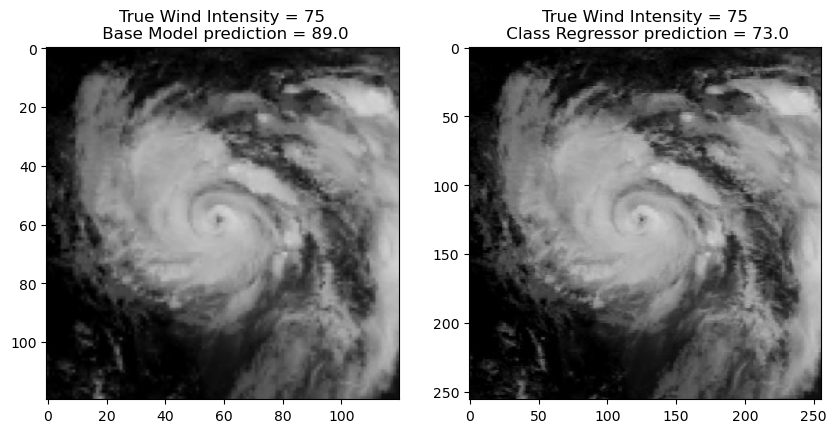

In [92]:
plt.figure(figsize=(10,10))
plt.subplot(121)
numbase = 36
plt.imshow(test_images[numbase][0][0])
plt.title(f"True Wind Intensity = {labels[numbase]}\n Base Model prediction = {str(preds_BaseModel[numbase][0].round())}")
plt.subplot(122)
plt.imshow(Class_2_aug_test[36][0][0])
plt.title(f"True Wind Intensity = {True_r2[36]}\n Class Regressor prediction = {str(predictions_r2[36][0].round())}")
plt.show()

In [118]:
test_generator = ImageDataGenerator(rescale = 1./255)
    
test_images = test_generator.flow_from_dataframe(
dataframe=Test_data,
x_col='ImagePath',
y_col='Wind_Speed',
target_size=(120,120),
color_mode='rgb',
class_mode='raw',
batch_size=1,
shuffle=False
)

Found 44377 validated image filenames.


In [119]:
BaseRegModel.evaluate(test_images)

44377/44377 [==============================] - 161s 4ms/step - loss: 8.0255 - root_mean_squared_error: 11.1878


[8.02554988861084, 11.187849998474121]

# Regression only model predictions

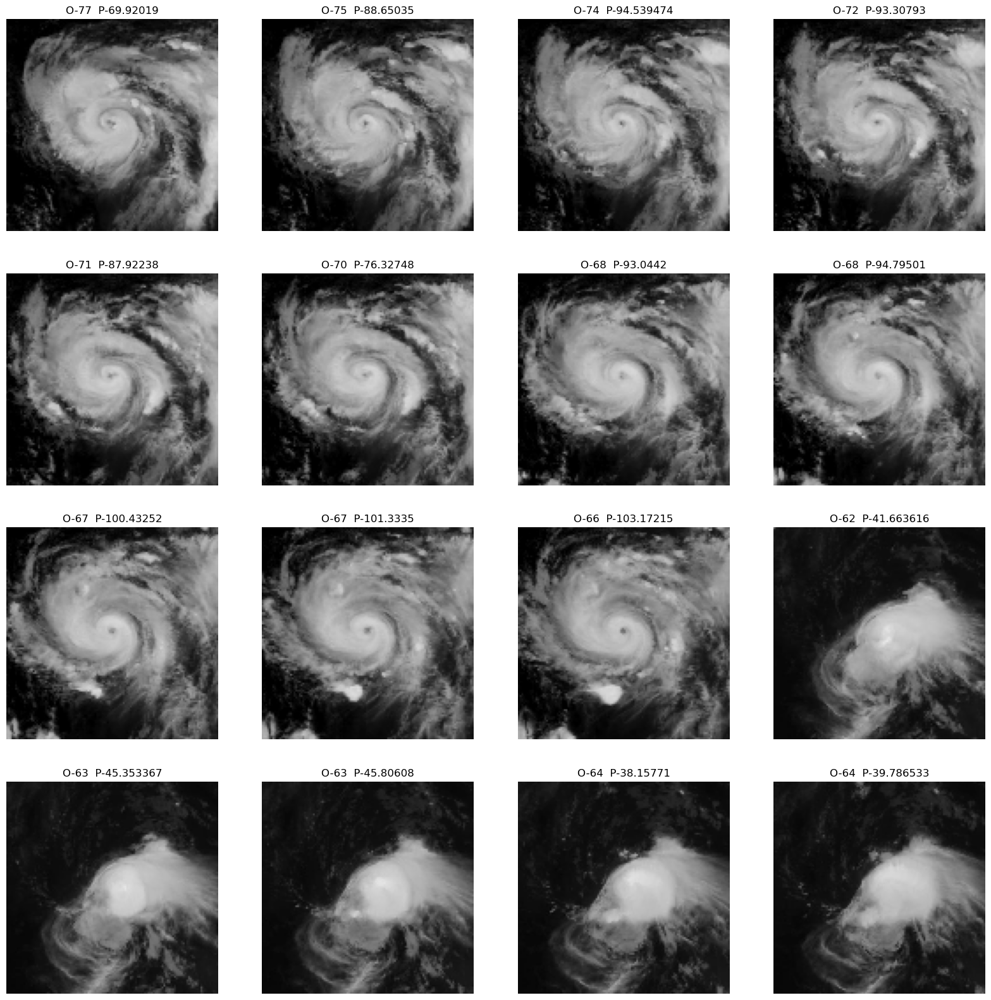

In [86]:
plt.figure(figsize=(20, 20))
addbase=35
for i in range(16):
    try:
        cur_img = test_images[i+addbase][0][0]
        ax = plt.subplot(4,4, i + 1)
        plt.title("O-"+str(labels[i+addbase])+"  P-"+str(preds_BaseModel[i+addbase][0]))
        plt.imshow(cur_img)
        plt.axis("off")
    except:
        continue

# Classification + Regression only model predictions

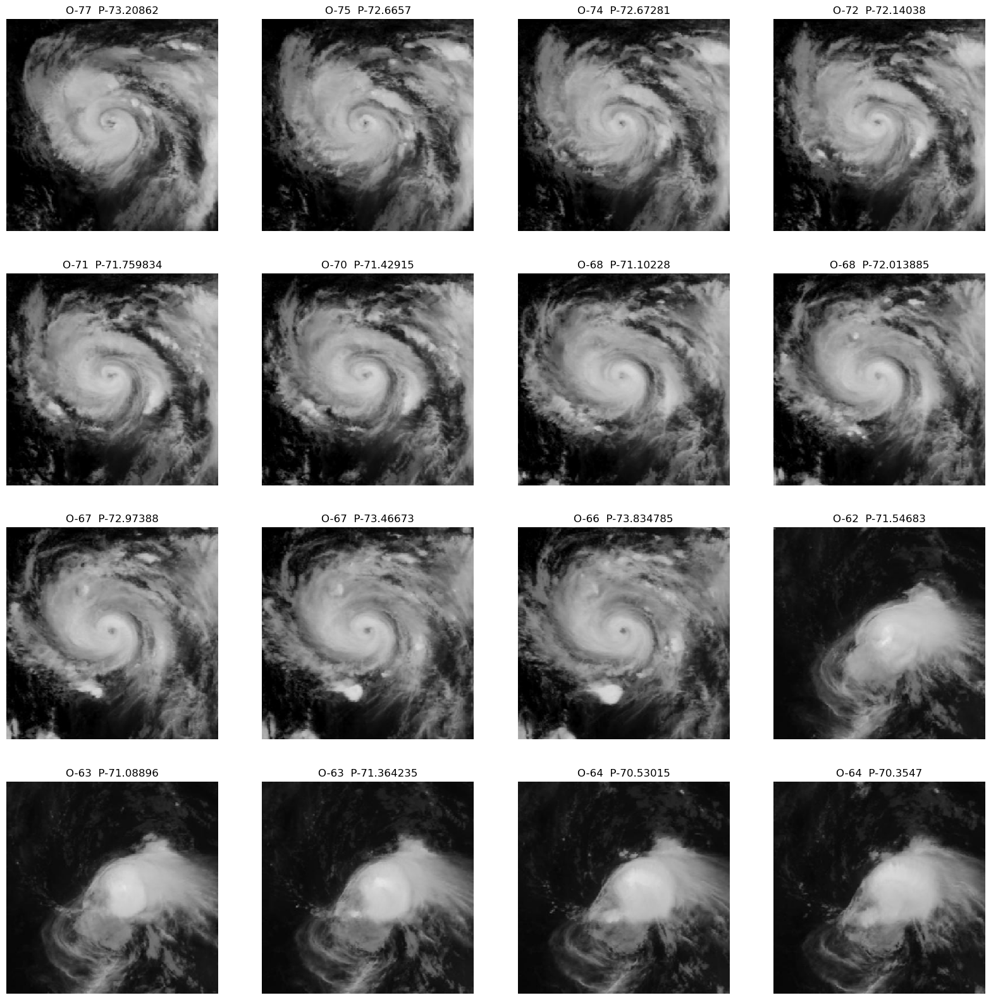

In [94]:
plt.figure(figsize=(20, 20))
addbase=35
for i in range(16):
    cur_img = Class_2_aug_test[i+addbase][0][0]
    ax = plt.subplot(4,4, i + 1)
    plt.title("O-"+str(True_r2[i+addbase])+"  P-"+str(predictions_r2[i+addbase][0]))
    plt.imshow(cur_img)
    plt.axis("off")

- To combine the results of the two neural nets we can use a simple if else ladder or since we have a softmax weightage for each class we could run a weighted average for the top 3 classifications and do a weighted ensemble method.